# Imports

In [43]:
import sys
sys.path.insert(1, '../..')

import convml_tt
from utils import *

from convml_tt.system import TripletTrainerModel, TripletTrainerDataModule
from convml_tt.data.examples import fetch_example_dataset, ExampleData, fetch_pretrained_model, PretrainedModel
from convml_tt.data.dataset import TileType, ImageSingletDataset
from convml_tt.utils import get_embeddings
import convml_tt.interpretation
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection

import xarray as xr
import pandas as pd
import pytorch_lightning as pl
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import torch
from sklearn.decomposition import PCA
from PIL import Image
import os, shutil
from matplotlib.patches import Rectangle as rectan
from random import seed
from random import randint
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid
from tqdm.notebook import tqdm


from convml_tt.interpretation.rectpred.transform import apply_transform
from convml_tt.data.examples import load_pretrained_model, PretrainedModel
from convml_tt.interpretation.rectpred.data import make_sliding_tile_model_predictions
from convml_tt.interpretation.rectpred.plot import make_rgb


TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
TEST_SIZE = 0.3
RANDOM_STATE = 1024
COLORS = ['b', 'g', 'r', 'm'] # Color of each class
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
#DATASET_DIR = "../../../NC/zooniverse/"
DATASET_DIR = "/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/"
print(cv2.__version__)
print(np.__version__)
pca = PCA(n_components=3, svd_solver='arpack')

4.5.3
1.20.1


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Reading Leif Model

In [2]:
model_path = fetch_pretrained_model(pretrained_model=PretrainedModel.FIXED_NORM_STAGE2, data_dir="../../")
#model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="c:/Users/Ray/Documents/Stage/MODELS/checkpt")
model = TripletTrainerModel.load_from_checkpoint(checkpoint_path="/home/fbrient/Dropbox/Documents/Stages/2021/IA/Internship_files/models/Tile2Vec/zooniverse-model.ckpt")
print(model_path)
print(model)

Using downloaded and verified file: ../../fixednorm-stage-2.tgz
Extracting ../../fixednorm-stage-2.tgz to ../../


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


../../fixednorm-stage-2.torch.pkl
TripletTrainerModel(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
      (1): BlurPool(
        (pad): ReflectionPad2d((1, 2, 1, 2))
      )
    )
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_

## Reading Zooniverse dataset downloaded from : https://www.kaggle.com/c/understanding_cloud_organization/data

In [3]:
#df = pd.read_csv("../../../NC/zooniverse/train.csv")
df = pd.read_csv("/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train.csv")

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [4]:
print(df)

              Image_Label                                      EncodedPixels
0        0011165.jpg_Fish  264918 937 266318 937 267718 937 269118 937 27...
1      0011165.jpg_Flower  1355565 1002 1356965 1002 1358365 1002 1359765...
2      0011165.jpg_Gravel                                                NaN
3       0011165.jpg_Sugar                                                NaN
4        002be4f.jpg_Fish  233813 878 235213 878 236613 878 238010 881 23...
...                   ...                                                ...
22179   ffd6680.jpg_Sugar                                                NaN
22180    ffea4f4.jpg_Fish                                                NaN
22181  ffea4f4.jpg_Flower  1194860 675 1196260 675 1197660 675 1199060 67...
22182  ffea4f4.jpg_Gravel                                                NaN
22183   ffea4f4.jpg_Sugar                                                NaN

[22184 rows x 2 columns]


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Preparing different columns of dataframe

In [5]:
df['Image'] = df['Image_Label'].map(lambda x: x.split('_')[0])
df['Class'] = df['Image_Label'].map(lambda x: x.split('_')[1])
classes = df['Class'].unique()
train_df = df.groupby('Image')['Class'].agg(set).reset_index()
for class_name in classes:
    df[class_name] = df['Class'].map(lambda x: 1 if class_name in x else 0)
df.head()

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Image_Label,EncodedPixels,Image,Class,Fish,Flower,Gravel,Sugar
0,0011165.jpg_Fish,264918 937 266318 937 267718 937 269118 937 27...,0011165.jpg,Fish,1,0,0,0
1,0011165.jpg_Flower,1355565 1002 1356965 1002 1358365 1002 1359765...,0011165.jpg,Flower,0,1,0,0
2,0011165.jpg_Gravel,NaN,0011165.jpg,Gravel,0,0,1,0
3,0011165.jpg_Sugar,NaN,0011165.jpg,Sugar,0,0,0,1
4,002be4f.jpg_Fish,233813 878 235213 878 236613 878 238010 881 23...,002be4f.jpg,Fish,1,0,0,0


## Preparing functions to extract masks of bounding boxes

In [6]:
# Creating training samples

image_col = np.array(df['Image'])
image_files = image_col[::4]
all_labels = df['Class']
X_train, y_train = image_files, all_labels
train_pairs = np.array(list(zip(X_train, y_train)))
TILE_FILENAME_FORMAT = "{triplet_id:05d}_{tile_type}.png"
NUM_TRAIN_SAMPLES = len(train_pairs)
train_samples = train_pairs[np.random.choice(train_pairs.shape[0], NUM_TRAIN_SAMPLES, replace=False), :]

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Creating training tile dataset

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/5546 [00:00<?, ?it/s]

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f91fc07.jpg


<ipython-input-7-48832841d66c>:57: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))


../../NC/division/train/00000_anchor.png
../../NC/division/train/00001_anchor.png
../../NC/division/train/00002_anchor.png
../../NC/division/train/00003_anchor.png


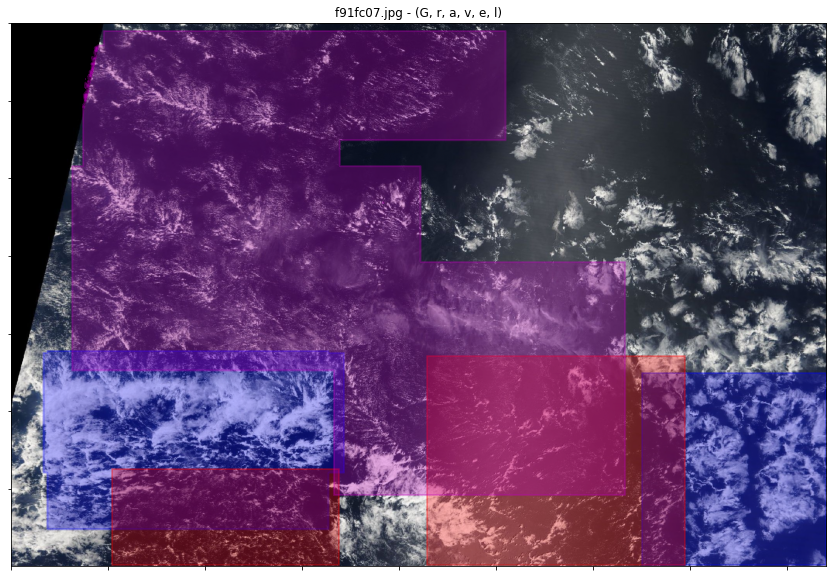

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/61df166.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/939999f.jpg
../../NC/division/train/00004_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fd02ab6.jpg
../../NC/division/train/00005_anchor.png
../../NC/division/train/00006_anchor.png
../../NC/division/train/00007_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/676806e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e2b4f04.jpg
../../NC/division/train/00008_anchor.png
../../NC/division/train/00009_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b27759f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f699300.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b9345a6.jpg
../../NC/division/train/00010_anchor.png
../../NC/division/train/00011_anchor.png
../../NC/division/train/00012_anchor.png
/home/fbrient/D

../../NC/division/train/00149_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/363528a.jpg
../../NC/division/train/00150_anchor.png
../../NC/division/train/00151_anchor.png
../../NC/division/train/00152_anchor.png
../../NC/division/train/00153_anchor.png
../../NC/division/train/00154_anchor.png
../../NC/division/train/00155_anchor.png
../../NC/division/train/00156_anchor.png
../../NC/division/train/00157_anchor.png
../../NC/division/train/00158_anchor.png
../../NC/division/train/00159_anchor.png
../../NC/division/train/00160_anchor.png
../../NC/division/train/00161_anchor.png
../../NC/division/train/00162_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f4e82e9.jpg
../../NC/division/train/00163_anchor.png
../../NC/division/train/00164_anchor.png
../../NC/division/train/00165_anchor.png
../../NC/division/train/00166_anchor.png
../../NC/division/train/00167_anchor.png
../../NC/division/train/00168_anchor.png
../../NC/division/train/00

../../NC/division/train/00301_anchor.png
../../NC/division/train/00302_anchor.png
../../NC/division/train/00303_anchor.png
../../NC/division/train/00304_anchor.png
../../NC/division/train/00305_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d82aebf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/538eb3e.jpg
../../NC/division/train/00306_anchor.png
../../NC/division/train/00307_anchor.png
../../NC/division/train/00308_anchor.png
../../NC/division/train/00309_anchor.png
../../NC/division/train/00310_anchor.png
../../NC/division/train/00311_anchor.png
../../NC/division/train/00312_anchor.png
../../NC/division/train/00313_anchor.png
../../NC/division/train/00314_anchor.png
../../NC/division/train/00315_anchor.png
../../NC/division/train/00316_anchor.png
../../NC/division/train/00317_anchor.png
../../NC/division/train/00318_anchor.png
../../NC/division/train/00319_anchor.png
../../NC/division/train/00320_anchor.png
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/202bbe5.jpg
../../NC/division/train/00438_anchor.png
../../NC/division/train/00439_anchor.png
../../NC/division/train/00440_anchor.png
../../NC/division/train/00441_anchor.png
../../NC/division/train/00442_anchor.png
../../NC/division/train/00443_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0dcd917.jpg
../../NC/division/train/00444_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ce0e3d9.jpg
../../NC/division/train/00445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c572bb6.jpg
../../NC/division/train/00446_anchor.png
../../NC/division/train/00447_anchor.png
../../NC/division/train/00448_anchor.png
../../NC/division/train/00449_anchor.png
../../NC/division/train/00450_anchor.png
../../NC/division/train/00451_anchor.png
../../NC/division/train/00452_anchor.png
../../NC/division/train/00453_anchor.png
/home/fbrient/Dropbox/Documents/EURE

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a381186.jpg
../../NC/division/train/00594_anchor.png
../../NC/division/train/00595_anchor.png
../../NC/division/train/00596_anchor.png
../../NC/division/train/00597_anchor.png
../../NC/division/train/00598_anchor.png
../../NC/division/train/00599_anchor.png
../../NC/division/train/00600_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f2cac27.jpg
../../NC/division/train/00601_anchor.png
../../NC/division/train/00602_anchor.png
../../NC/division/train/00603_anchor.png
../../NC/division/train/00604_anchor.png
../../NC/division/train/00605_anchor.png
../../NC/division/train/00606_anchor.png
../../NC/division/train/00607_anchor.png
../../NC/division/train/00608_anchor.png
../../NC/division/train/00609_anchor.png
../../NC/division/train/00610_anchor.png
../../NC/division/train/00611_anchor.png
../../NC/division/train/00612_anchor.png
../../NC/division/train/00613_anchor.png
/home/fbrient/Dropbox/Docu

../../NC/division/train/00742_anchor.png
../../NC/division/train/00743_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/512f9ae.jpg
../../NC/division/train/00744_anchor.png
../../NC/division/train/00745_anchor.png
../../NC/division/train/00746_anchor.png
../../NC/division/train/00747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/422ec1e.jpg
../../NC/division/train/00748_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/551efa2.jpg
../../NC/division/train/00749_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/79722b5.jpg
../../NC/division/train/00750_anchor.png
../../NC/division/train/00751_anchor.png
../../NC/division/train/00752_anchor.png
../../NC/division/train/00753_anchor.png
../../NC/division/train/00754_anchor.png
../../NC/division/train/00755_anchor.png
../../NC/division/train/00756_anchor.png
../../NC/division/train/00757_anchor.png
../../NC/division/train/00758_anchor

../../NC/division/train/00868_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5488e4d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f0eebb6.jpg
../../NC/division/train/00869_anchor.png
../../NC/division/train/00870_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bf191a9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f954bde.jpg
../../NC/division/train/00871_anchor.png
../../NC/division/train/00872_anchor.png
../../NC/division/train/00873_anchor.png
../../NC/division/train/00874_anchor.png
../../NC/division/train/00875_anchor.png
../../NC/division/train/00876_anchor.png
../../NC/division/train/00877_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6815a8b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f3a06e8.jpg
../../NC/division/train/00878_anchor.png
../../NC/division/train/00879_anchor.png
../../NC/division/train/00880_anchor.png
../..

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d819d94.jpg
../../NC/division/train/01020_anchor.png
../../NC/division/train/01021_anchor.png
../../NC/division/train/01022_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/175da8e.jpg
../../NC/division/train/01023_anchor.png
../../NC/division/train/01024_anchor.png
../../NC/division/train/01025_anchor.png
../../NC/division/train/01026_anchor.png
../../NC/division/train/01027_anchor.png
../../NC/division/train/01028_anchor.png
../../NC/division/train/01029_anchor.png
../../NC/division/train/01030_anchor.png
../../NC/division/train/01031_anchor.png
../../NC/division/train/01032_anchor.png
../../NC/division/train/01033_anchor.png
../../NC/division/train/01034_anchor.png
../../NC/division/train/01035_anchor.png
../../NC/division/train/01036_anchor.png
../../NC/division/train/01037_anchor.png
../../NC/division/train/01038_anchor.png
../../NC/division/train/01039_anchor.png
../../NC/division/train/01

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f37f67.jpg
../../NC/division/train/01166_anchor.png
../../NC/division/train/01167_anchor.png
../../NC/division/train/01168_anchor.png
../../NC/division/train/01169_anchor.png
../../NC/division/train/01170_anchor.png
../../NC/division/train/01171_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/94667e6.jpg
../../NC/division/train/01172_anchor.png
../../NC/division/train/01173_anchor.png
../../NC/division/train/01174_anchor.png
../../NC/division/train/01175_anchor.png
../../NC/division/train/01176_anchor.png
../../NC/division/train/01177_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/25771e9.jpg
../../NC/division/train/01178_anchor.png
../../NC/division/train/01179_anchor.png
../../NC/division/train/01180_anchor.png
../../NC/division/train/01181_anchor.png
../../NC/division/train/01182_anchor.png
../../NC/division/train/01183_anchor.png
../../NC/division/train/01184_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d6a49aa.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/80752ff.jpg
../../NC/division/train/01299_anchor.png
../../NC/division/train/01300_anchor.png
../../NC/division/train/01301_anchor.png
../../NC/division/train/01302_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b546d12.jpg
../../NC/division/train/01303_anchor.png
../../NC/division/train/01304_anchor.png
../../NC/division/train/01305_anchor.png
../../NC/division/train/01306_anchor.png
../../NC/division/train/01307_anchor.png
../../NC/division/train/01308_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c1e099.jpg
../../NC/division/train/01309_anchor.png
../../NC/division/train/01310_anchor.png
../../NC/division/train/01311_anchor.png
../../NC/division/train/01312_anchor.png
../../NC/division/train/01313_anchor.png
../../NC/division/train/01314_anchor.png
../../NC/division/train/01315_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/af063b0.jpg
../../NC/division/train/01442_anchor.png
../../NC/division/train/01443_anchor.png
../../NC/division/train/01444_anchor.png
../../NC/division/train/01445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/95a1be9.jpg
../../NC/division/train/01446_anchor.png
../../NC/division/train/01447_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a14aa0d.jpg
../../NC/division/train/01448_anchor.png
../../NC/division/train/01449_anchor.png
../../NC/division/train/01450_anchor.png
../../NC/division/train/01451_anchor.png
../../NC/division/train/01452_anchor.png
../../NC/division/train/01453_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8826bd9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9a7608.jpg
../../NC/division/train/01454_anchor.png
../../NC/division/train/01455_anchor.png
../../NC/division/train/01456_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/48f2ea7.jpg
../../NC/division/train/01588_anchor.png
../../NC/division/train/01589_anchor.png
../../NC/division/train/01590_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/75b2c2c.jpg
../../NC/division/train/01591_anchor.png
../../NC/division/train/01592_anchor.png
../../NC/division/train/01593_anchor.png
../../NC/division/train/01594_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/36f78f9.jpg
../../NC/division/train/01595_anchor.png
../../NC/division/train/01596_anchor.png
../../NC/division/train/01597_anchor.png
../../NC/division/train/01598_anchor.png
../../NC/division/train/01599_anchor.png
../../NC/division/train/01600_anchor.png
../../NC/division/train/01601_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8b3e4d6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d20d37.jpg
../../NC/division/train/01602_anchor.png


../../NC/division/train/01699_anchor.png
../../NC/division/train/01700_anchor.png
../../NC/division/train/01701_anchor.png
../../NC/division/train/01702_anchor.png
../../NC/division/train/01703_anchor.png
../../NC/division/train/01704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fdd7492.jpg
../../NC/division/train/01705_anchor.png
../../NC/division/train/01706_anchor.png
../../NC/division/train/01707_anchor.png
../../NC/division/train/01708_anchor.png
../../NC/division/train/01709_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5c3b6b2.jpg
../../NC/division/train/01710_anchor.png
../../NC/division/train/01711_anchor.png
../../NC/division/train/01712_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f8089c.jpg
../../NC/division/train/01713_anchor.png
../../NC/division/train/01714_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/79e08a1.jpg
/home/fbrient/Dropbox/Documents/EURE

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e61a35.jpg
../../NC/division/train/01837_anchor.png
../../NC/division/train/01838_anchor.png
../../NC/division/train/01839_anchor.png
../../NC/division/train/01840_anchor.png
../../NC/division/train/01841_anchor.png
../../NC/division/train/01842_anchor.png
../../NC/division/train/01843_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4152ee5.jpg
../../NC/division/train/01844_anchor.png
../../NC/division/train/01845_anchor.png
../../NC/division/train/01846_anchor.png
../../NC/division/train/01847_anchor.png
../../NC/division/train/01848_anchor.png
../../NC/division/train/01849_anchor.png
../../NC/division/train/01850_anchor.png
../../NC/division/train/01851_anchor.png
../../NC/division/train/01852_anchor.png
../../NC/division/train/01853_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/221b3c5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f02b552

../../NC/division/train/01997_anchor.png
../../NC/division/train/01998_anchor.png
../../NC/division/train/01999_anchor.png
../../NC/division/train/02000_anchor.png
../../NC/division/train/02001_anchor.png
../../NC/division/train/02002_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3fc1779.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c3ecc72.jpg
../../NC/division/train/02003_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/42e99c6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d6e82c0.jpg
../../NC/division/train/02004_anchor.png
../../NC/division/train/02005_anchor.png
../../NC/division/train/02006_anchor.png
../../NC/division/train/02007_anchor.png
../../NC/division/train/02008_anchor.png
../../NC/division/train/02009_anchor.png
../../NC/division/train/02010_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dd9eff5.jpg
../../NC/division/train/02011_anchor.png


../../NC/division/train/02136_anchor.png
../../NC/division/train/02137_anchor.png
../../NC/division/train/02138_anchor.png
../../NC/division/train/02139_anchor.png
../../NC/division/train/02140_anchor.png
../../NC/division/train/02141_anchor.png
../../NC/division/train/02142_anchor.png
../../NC/division/train/02143_anchor.png
../../NC/division/train/02144_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/78b51ec.jpg
../../NC/division/train/02145_anchor.png
../../NC/division/train/02146_anchor.png
../../NC/division/train/02147_anchor.png
../../NC/division/train/02148_anchor.png
../../NC/division/train/02149_anchor.png
../../NC/division/train/02150_anchor.png
../../NC/division/train/02151_anchor.png
../../NC/division/train/02152_anchor.png
../../NC/division/train/02153_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bf287e6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8e53178.jpg
../../NC/division/train/02154_a

../../NC/division/train/02291_anchor.png
../../NC/division/train/02292_anchor.png
../../NC/division/train/02293_anchor.png
../../NC/division/train/02294_anchor.png
../../NC/division/train/02295_anchor.png
../../NC/division/train/02296_anchor.png
../../NC/division/train/02297_anchor.png
../../NC/division/train/02298_anchor.png
../../NC/division/train/02299_anchor.png
../../NC/division/train/02300_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1abb599.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/542837e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/587168a.jpg
../../NC/division/train/02301_anchor.png
../../NC/division/train/02302_anchor.png
../../NC/division/train/02303_anchor.png
../../NC/division/train/02304_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6f10432.jpg
../../NC/division/train/02305_anchor.png
../../NC/division/train/02306_anchor.png
../../NC/division/train/02307_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/aef42dc.jpg
../../NC/division/train/02456_anchor.png
../../NC/division/train/02457_anchor.png
../../NC/division/train/02458_anchor.png
../../NC/division/train/02459_anchor.png
../../NC/division/train/02460_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/60d8612.jpg
../../NC/division/train/02461_anchor.png
../../NC/division/train/02462_anchor.png
../../NC/division/train/02463_anchor.png
../../NC/division/train/02464_anchor.png
../../NC/division/train/02465_anchor.png
../../NC/division/train/02466_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3568623.jpg
../../NC/division/train/02467_anchor.png
../../NC/division/train/02468_anchor.png
../../NC/division/train/02469_anchor.png
../../NC/division/train/02470_anchor.png
../../NC/division/train/02471_anchor.png
../../NC/division/train/02472_anchor.png
../../NC/division/train/02473_anchor.png
../../NC/division/train/02474_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/69c3d5d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c6d834b.jpg
../../NC/division/train/02599_anchor.png
../../NC/division/train/02600_anchor.png
../../NC/division/train/02601_anchor.png
../../NC/division/train/02602_anchor.png
../../NC/division/train/02603_anchor.png
../../NC/division/train/02604_anchor.png
../../NC/division/train/02605_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bae97cb.jpg
../../NC/division/train/02606_anchor.png
../../NC/division/train/02607_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d179c14.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8dfcd9f.jpg
../../NC/division/train/02608_anchor.png
../../NC/division/train/02609_anchor.png
../../NC/division/train/02610_anchor.png
../../NC/division/train/02611_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8857560.jpg
../..

../../NC/division/train/02725_anchor.png
../../NC/division/train/02726_anchor.png
../../NC/division/train/02727_anchor.png
../../NC/division/train/02728_anchor.png
../../NC/division/train/02729_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/09024fd.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d74517a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b085f55.jpg
../../NC/division/train/02730_anchor.png
../../NC/division/train/02731_anchor.png
../../NC/division/train/02732_anchor.png
../../NC/division/train/02733_anchor.png
../../NC/division/train/02734_anchor.png
../../NC/division/train/02735_anchor.png
../../NC/division/train/02736_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5062ed7.jpg
../../NC/division/train/02737_anchor.png
../../NC/division/train/02738_anchor.png
../../NC/division/train/02739_anchor.png
../../NC/division/train/02740_anchor.png
../../NC/division/train/02741_anchor

../../NC/division/train/02879_anchor.png
../../NC/division/train/02880_anchor.png
../../NC/division/train/02881_anchor.png
../../NC/division/train/02882_anchor.png
../../NC/division/train/02883_anchor.png
../../NC/division/train/02884_anchor.png
../../NC/division/train/02885_anchor.png
../../NC/division/train/02886_anchor.png
../../NC/division/train/02887_anchor.png
../../NC/division/train/02888_anchor.png
../../NC/division/train/02889_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/45bb58b.jpg
../../NC/division/train/02890_anchor.png
../../NC/division/train/02891_anchor.png
../../NC/division/train/02892_anchor.png
../../NC/division/train/02893_anchor.png
../../NC/division/train/02894_anchor.png
../../NC/division/train/02895_anchor.png
../../NC/division/train/02896_anchor.png
../../NC/division/train/02897_anchor.png
../../NC/division/train/02898_anchor.png
../../NC/division/train/02899_anchor.png
../../NC/division/train/02900_anchor.png
/home/fbrient/Dropbox

../../NC/division/train/03018_anchor.png
../../NC/division/train/03019_anchor.png
../../NC/division/train/03020_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/65e4b8e.jpg
../../NC/division/train/03021_anchor.png
../../NC/division/train/03022_anchor.png
../../NC/division/train/03023_anchor.png
../../NC/division/train/03024_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c590a8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f0d3169.jpg
../../NC/division/train/03025_anchor.png
../../NC/division/train/03026_anchor.png
../../NC/division/train/03027_anchor.png
../../NC/division/train/03028_anchor.png
../../NC/division/train/03029_anchor.png
../../NC/division/train/03030_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/582a2f9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10257e5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f39b0e.jpg
../..

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/20fd60a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/efe1652.jpg
../../NC/division/train/03156_anchor.png
../../NC/division/train/03157_anchor.png
../../NC/division/train/03158_anchor.png
../../NC/division/train/03159_anchor.png
../../NC/division/train/03160_anchor.png
../../NC/division/train/03161_anchor.png
../../NC/division/train/03162_anchor.png
../../NC/division/train/03163_anchor.png
../../NC/division/train/03164_anchor.png
../../NC/division/train/03165_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e798b9b.jpg
../../NC/division/train/03166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e63156c.jpg
../../NC/division/train/03167_anchor.png
../../NC/division/train/03168_anchor.png
../../NC/division/train/03169_anchor.png
../../NC/division/train/03170_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1149759.jpg


../../NC/division/train/03299_anchor.png
../../NC/division/train/03300_anchor.png
../../NC/division/train/03301_anchor.png
../../NC/division/train/03302_anchor.png
../../NC/division/train/03303_anchor.png
../../NC/division/train/03304_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1cc2e60.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3e4e92c.jpg
../../NC/division/train/03305_anchor.png
../../NC/division/train/03306_anchor.png
../../NC/division/train/03307_anchor.png
../../NC/division/train/03308_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ce3fd89.jpg
../../NC/division/train/03309_anchor.png
../../NC/division/train/03310_anchor.png
../../NC/division/train/03311_anchor.png
../../NC/division/train/03312_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b502862.jpg
../../NC/division/train/03313_anchor.png
../../NC/division/train/03314_anchor.png
../../NC/division/train/03315_anchor

../../NC/division/train/03435_anchor.png
../../NC/division/train/03436_anchor.png
../../NC/division/train/03437_anchor.png
../../NC/division/train/03438_anchor.png
../../NC/division/train/03439_anchor.png
../../NC/division/train/03440_anchor.png
../../NC/division/train/03441_anchor.png
../../NC/division/train/03442_anchor.png
../../NC/division/train/03443_anchor.png
../../NC/division/train/03444_anchor.png
../../NC/division/train/03445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/469c7a3.jpg
../../NC/division/train/03446_anchor.png
../../NC/division/train/03447_anchor.png
../../NC/division/train/03448_anchor.png
../../NC/division/train/03449_anchor.png
../../NC/division/train/03450_anchor.png
../../NC/division/train/03451_anchor.png
../../NC/division/train/03452_anchor.png
../../NC/division/train/03453_anchor.png
../../NC/division/train/03454_anchor.png
../../NC/division/train/03455_anchor.png
../../NC/division/train/03456_anchor.png
../../NC/division/tra

../../NC/division/train/03560_anchor.png
../../NC/division/train/03561_anchor.png
../../NC/division/train/03562_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d5519b0.jpg
../../NC/division/train/03563_anchor.png
../../NC/division/train/03564_anchor.png
../../NC/division/train/03565_anchor.png
../../NC/division/train/03566_anchor.png
../../NC/division/train/03567_anchor.png
../../NC/division/train/03568_anchor.png
../../NC/division/train/03569_anchor.png
../../NC/division/train/03570_anchor.png
../../NC/division/train/03571_anchor.png
../../NC/division/train/03572_anchor.png
../../NC/division/train/03573_anchor.png
../../NC/division/train/03574_anchor.png
../../NC/division/train/03575_anchor.png
../../NC/division/train/03576_anchor.png
../../NC/division/train/03577_anchor.png
../../NC/division/train/03578_anchor.png
../../NC/division/train/03579_anchor.png
../../NC/division/train/03580_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_imag

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d2e0f14.jpg
../../NC/division/train/03694_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c5c0133.jpg
../../NC/division/train/03695_anchor.png
../../NC/division/train/03696_anchor.png
../../NC/division/train/03697_anchor.png
../../NC/division/train/03698_anchor.png
../../NC/division/train/03699_anchor.png
../../NC/division/train/03700_anchor.png
../../NC/division/train/03701_anchor.png
../../NC/division/train/03702_anchor.png
../../NC/division/train/03703_anchor.png
../../NC/division/train/03704_anchor.png
../../NC/division/train/03705_anchor.png
../../NC/division/train/03706_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ec21516.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/002be4f.jpg
../../NC/division/train/03707_anchor.png
../../NC/division/train/03708_anchor.png
../../NC/division/train/03709_anchor.png
../../NC/division/train/03710_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cf42914.jpg
../../NC/division/train/03825_anchor.png
../../NC/division/train/03826_anchor.png
../../NC/division/train/03827_anchor.png
../../NC/division/train/03828_anchor.png
../../NC/division/train/03829_anchor.png
../../NC/division/train/03830_anchor.png
../../NC/division/train/03831_anchor.png
../../NC/division/train/03832_anchor.png
../../NC/division/train/03833_anchor.png
../../NC/division/train/03834_anchor.png
../../NC/division/train/03835_anchor.png
../../NC/division/train/03836_anchor.png
../../NC/division/train/03837_anchor.png
../../NC/division/train/03838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d115c0.jpg
../../NC/division/train/03839_anchor.png
../../NC/division/train/03840_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/19e1a35.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4323dbb.jpg
../../NC/division/train/03841_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e7f907c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e5405df.jpg
../../NC/division/train/03959_anchor.png
../../NC/division/train/03960_anchor.png
../../NC/division/train/03961_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/47c100b.jpg
../../NC/division/train/03962_anchor.png
../../NC/division/train/03963_anchor.png
../../NC/division/train/03964_anchor.png
../../NC/division/train/03965_anchor.png
../../NC/division/train/03966_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b7cabc8.jpg
../../NC/division/train/03967_anchor.png
../../NC/division/train/03968_anchor.png
../../NC/division/train/03969_anchor.png
../../NC/division/train/03970_anchor.png
../../NC/division/train/03971_anchor.png
../../NC/division/train/03972_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b282d6.jpg
../../NC/division/train/03973_anchor.png


../../NC/division/train/04094_anchor.png
../../NC/division/train/04095_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/12db338.jpg
../../NC/division/train/04096_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30d17a5.jpg
../../NC/division/train/04097_anchor.png
../../NC/division/train/04098_anchor.png
../../NC/division/train/04099_anchor.png
../../NC/division/train/04100_anchor.png
../../NC/division/train/04101_anchor.png
../../NC/division/train/04102_anchor.png
../../NC/division/train/04103_anchor.png
../../NC/division/train/04104_anchor.png
../../NC/division/train/04105_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/12ae62b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/da43152.jpg
../../NC/division/train/04106_anchor.png
../../NC/division/train/04107_anchor.png
../../NC/division/train/04108_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b31473.jpg


../../NC/division/train/04225_anchor.png
../../NC/division/train/04226_anchor.png
../../NC/division/train/04227_anchor.png
../../NC/division/train/04228_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1ae4549.jpg
../../NC/division/train/04229_anchor.png
../../NC/division/train/04230_anchor.png
../../NC/division/train/04231_anchor.png
../../NC/division/train/04232_anchor.png
../../NC/division/train/04233_anchor.png
../../NC/division/train/04234_anchor.png
../../NC/division/train/04235_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4efb7c0.jpg
../../NC/division/train/04236_anchor.png
../../NC/division/train/04237_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/27069e6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/59fa976.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b0df6d.jpg
../../NC/division/train/04238_anchor.png
../../NC/division/train/04239_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e7431c2.jpg
../../NC/division/train/04366_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e2cae44.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b38dcd4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5c3ec3b.jpg
../../NC/division/train/04367_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4274e30.jpg
../../NC/division/train/04368_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d75fa24.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fd02da7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db5a703.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cdc7c95.jpg
../../NC/division/train/04369_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c1748a5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2

../../NC/division/train/04499_anchor.png
../../NC/division/train/04500_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be4c586.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/04920b8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d369c9.jpg
../../NC/division/train/04501_anchor.png
../../NC/division/train/04502_anchor.png
../../NC/division/train/04503_anchor.png
../../NC/division/train/04504_anchor.png
../../NC/division/train/04505_anchor.png
../../NC/division/train/04506_anchor.png
../../NC/division/train/04507_anchor.png
../../NC/division/train/04508_anchor.png
../../NC/division/train/04509_anchor.png
../../NC/division/train/04510_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/85eabc1.jpg
../../NC/division/train/04511_anchor.png
../../NC/division/train/04512_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bd624da.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/D

../../NC/division/train/04633_anchor.png
../../NC/division/train/04634_anchor.png
../../NC/division/train/04635_anchor.png
../../NC/division/train/04636_anchor.png
../../NC/division/train/04637_anchor.png
../../NC/division/train/04638_anchor.png
../../NC/division/train/04639_anchor.png
../../NC/division/train/04640_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ecdbffb.jpg
../../NC/division/train/04641_anchor.png
../../NC/division/train/04642_anchor.png
../../NC/division/train/04643_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8201178.jpg
../../NC/division/train/04644_anchor.png
../../NC/division/train/04645_anchor.png
../../NC/division/train/04646_anchor.png
../../NC/division/train/04647_anchor.png
../../NC/division/train/04648_anchor.png
../../NC/division/train/04649_anchor.png
../../NC/division/train/04650_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d214f7a.jpg
../../NC/division/train/04651_a

../../NC/division/train/04769_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/315475d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a797193.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/640441a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f42e3d6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7f697c6.jpg
../../NC/division/train/04770_anchor.png
../../NC/division/train/04771_anchor.png
../../NC/division/train/04772_anchor.png
../../NC/division/train/04773_anchor.png
../../NC/division/train/04774_anchor.png
../../NC/division/train/04775_anchor.png
../../NC/division/train/04776_anchor.png
../../NC/division/train/04777_anchor.png
../../NC/division/train/04778_anchor.png
../../NC/division/train/04779_anchor.png
../../NC/division/train/04780_anchor.png
../../NC/division/train/04781_anchor.png
../../NC/division/train/04782_anchor.png
../../NC/division/train/04783_anchor.png


../../NC/division/train/04908_anchor.png
../../NC/division/train/04909_anchor.png
../../NC/division/train/04910_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/09d567c.jpg
../../NC/division/train/04911_anchor.png
../../NC/division/train/04912_anchor.png
../../NC/division/train/04913_anchor.png
../../NC/division/train/04914_anchor.png
../../NC/division/train/04915_anchor.png
../../NC/division/train/04916_anchor.png
../../NC/division/train/04917_anchor.png
../../NC/division/train/04918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6313558.jpg
../../NC/division/train/04919_anchor.png
../../NC/division/train/04920_anchor.png
../../NC/division/train/04921_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6fd97b.jpg
../../NC/division/train/04922_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5ea862d.jpg
../../NC/division/train/04923_anchor.png
../../NC/division/train/04924_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/182eb06.jpg
../../NC/division/train/05035_anchor.png
../../NC/division/train/05036_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ea08016.jpg
../../NC/division/train/05037_anchor.png
../../NC/division/train/05038_anchor.png
../../NC/division/train/05039_anchor.png
../../NC/division/train/05040_anchor.png
../../NC/division/train/05041_anchor.png
../../NC/division/train/05042_anchor.png
../../NC/division/train/05043_anchor.png
../../NC/division/train/05044_anchor.png
../../NC/division/train/05045_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7cbcee6.jpg
../../NC/division/train/05046_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5de46ee.jpg
../../NC/division/train/05047_anchor.png
../../NC/division/train/05048_anchor.png
../../NC/division/train/05049_anchor.png
../../NC/division/train/05050_anchor.png
../../NC/division/train/05051_anchor

../../NC/division/train/05175_anchor.png
../../NC/division/train/05176_anchor.png
../../NC/division/train/05177_anchor.png
../../NC/division/train/05178_anchor.png
../../NC/division/train/05179_anchor.png
../../NC/division/train/05180_anchor.png
../../NC/division/train/05181_anchor.png
../../NC/division/train/05182_anchor.png
../../NC/division/train/05183_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6dde2ac.jpg
../../NC/division/train/05184_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e0146fd.jpg
../../NC/division/train/05185_anchor.png
../../NC/division/train/05186_anchor.png
../../NC/division/train/05187_anchor.png
../../NC/division/train/05188_anchor.png
../../NC/division/train/05189_anchor.png
../../NC/division/train/05190_anchor.png
../../NC/division/train/05191_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b734fad.jpg
../../NC/division/train/05192_anchor.png
../../NC/division/train/05193_a

../../NC/division/train/05316_anchor.png
../../NC/division/train/05317_anchor.png
../../NC/division/train/05318_anchor.png
../../NC/division/train/05319_anchor.png
../../NC/division/train/05320_anchor.png
../../NC/division/train/05321_anchor.png
../../NC/division/train/05322_anchor.png
../../NC/division/train/05323_anchor.png
../../NC/division/train/05324_anchor.png
../../NC/division/train/05325_anchor.png
../../NC/division/train/05326_anchor.png
../../NC/division/train/05327_anchor.png
../../NC/division/train/05328_anchor.png
../../NC/division/train/05329_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db6052a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/74c2b84.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/77977fc.jpg
../../NC/division/train/05330_anchor.png
../../NC/division/train/05331_anchor.png
../../NC/division/train/05332_anchor.png
../../NC/division/train/05333_anchor.png
../../NC/division/train/05334_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6ef78d5.jpg
../../NC/division/train/05465_anchor.png
../../NC/division/train/05466_anchor.png
../../NC/division/train/05467_anchor.png
../../NC/division/train/05468_anchor.png
../../NC/division/train/05469_anchor.png
../../NC/division/train/05470_anchor.png
../../NC/division/train/05471_anchor.png
../../NC/division/train/05472_anchor.png
../../NC/division/train/05473_anchor.png
../../NC/division/train/05474_anchor.png
../../NC/division/train/05475_anchor.png
../../NC/division/train/05476_anchor.png
../../NC/division/train/05477_anchor.png
../../NC/division/train/05478_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dd9e131.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/140c4ef.jpg
../../NC/division/train/05479_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f8ad135.jpg
../../NC/division/train/05480_anchor.png
../../NC/division/train/05481_anchor

../../NC/division/train/05625_anchor.png
../../NC/division/train/05626_anchor.png
../../NC/division/train/05627_anchor.png
../../NC/division/train/05628_anchor.png
../../NC/division/train/05629_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/07f289d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9d40567.jpg
../../NC/division/train/05630_anchor.png
../../NC/division/train/05631_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3465da2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5303d92.jpg
../../NC/division/train/05632_anchor.png
../../NC/division/train/05633_anchor.png
../../NC/division/train/05634_anchor.png
../../NC/division/train/05635_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/09d0eee.jpg
../../NC/division/train/05636_anchor.png
../../NC/division/train/05637_anchor.png
../../NC/division/train/05638_anchor.png
../../NC/division/train/05639_anchor.png


../../NC/division/train/05765_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/35314d1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5033c51.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7c90935.jpg
../../NC/division/train/05766_anchor.png
../../NC/division/train/05767_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2fa6af2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/34acd35.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/688630d.jpg
../../NC/division/train/05768_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/94b019e.jpg
../../NC/division/train/05769_anchor.png
../../NC/division/train/05770_anchor.png
../../NC/division/train/05771_anchor.png
../../NC/division/train/05772_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/77e4e81.jpg
../../NC/division/train/05773_anchor.png
/home/fbrient/D

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5797732.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cf479d7.jpg
../../NC/division/train/05904_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3e4e22f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/46770f4.jpg
../../NC/division/train/05905_anchor.png
../../NC/division/train/05906_anchor.png
../../NC/division/train/05907_anchor.png
../../NC/division/train/05908_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d36b6d0.jpg
../../NC/division/train/05909_anchor.png
../../NC/division/train/05910_anchor.png
../../NC/division/train/05911_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/28084ab.jpg
../../NC/division/train/05912_anchor.png
../../NC/division/train/05913_anchor.png
../../NC/division/train/05914_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3dcfeab.jpg
../../NC/d

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d3ce19b.jpg
../../NC/division/train/06050_anchor.png
../../NC/division/train/06051_anchor.png
../../NC/division/train/06052_anchor.png
../../NC/division/train/06053_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68da8d1.jpg
../../NC/division/train/06054_anchor.png
../../NC/division/train/06055_anchor.png
../../NC/division/train/06056_anchor.png
../../NC/division/train/06057_anchor.png
../../NC/division/train/06058_anchor.png
../../NC/division/train/06059_anchor.png
../../NC/division/train/06060_anchor.png
../../NC/division/train/06061_anchor.png
../../NC/division/train/06062_anchor.png
../../NC/division/train/06063_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/86fa18e.jpg
../../NC/division/train/06064_anchor.png
../../NC/division/train/06065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/db06c8a.jpg
/home/fbrient/Dropbox/Documents/EURE

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ae47f2b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/663f53b.jpg
../../NC/division/train/06178_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bb40421.jpg
../../NC/division/train/06179_anchor.png
../../NC/division/train/06180_anchor.png
../../NC/division/train/06181_anchor.png
../../NC/division/train/06182_anchor.png
../../NC/division/train/06183_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a8dc8ca.jpg
../../NC/division/train/06184_anchor.png
../../NC/division/train/06185_anchor.png
../../NC/division/train/06186_anchor.png
../../NC/division/train/06187_anchor.png
../../NC/division/train/06188_anchor.png
../../NC/division/train/06189_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be123d6.jpg
../../NC/division/train/06190_anchor.png
../../NC/division/train/06191_anchor.png
../../NC/division/train/06192_anchor.png


../../NC/division/train/06325_anchor.png
../../NC/division/train/06326_anchor.png
../../NC/division/train/06327_anchor.png
../../NC/division/train/06328_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9ef2a30.jpg
../../NC/division/train/06329_anchor.png
../../NC/division/train/06330_anchor.png
../../NC/division/train/06331_anchor.png
../../NC/division/train/06332_anchor.png
../../NC/division/train/06333_anchor.png
../../NC/division/train/06334_anchor.png
../../NC/division/train/06335_anchor.png
../../NC/division/train/06336_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1353ca0.jpg
../../NC/division/train/06337_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/59ee98c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ea72c79.jpg
../../NC/division/train/06338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f07931.jpg
../../NC/division/train/06339_anchor.png


../../NC/division/train/06450_anchor.png
../../NC/division/train/06451_anchor.png
../../NC/division/train/06452_anchor.png
../../NC/division/train/06453_anchor.png
../../NC/division/train/06454_anchor.png
../../NC/division/train/06455_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2b51f11.jpg
../../NC/division/train/06456_anchor.png
../../NC/division/train/06457_anchor.png
../../NC/division/train/06458_anchor.png
../../NC/division/train/06459_anchor.png
../../NC/division/train/06460_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/32b9342.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0b32df8.jpg
../../NC/division/train/06461_anchor.png
../../NC/division/train/06462_anchor.png
../../NC/division/train/06463_anchor.png
../../NC/division/train/06464_anchor.png
../../NC/division/train/06465_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/945fc4b.jpg
../../NC/division/train/06466_anchor

../../NC/division/train/06595_anchor.png
../../NC/division/train/06596_anchor.png
../../NC/division/train/06597_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6cc47d.jpg
../../NC/division/train/06598_anchor.png
../../NC/division/train/06599_anchor.png
../../NC/division/train/06600_anchor.png
../../NC/division/train/06601_anchor.png
../../NC/division/train/06602_anchor.png
../../NC/division/train/06603_anchor.png
../../NC/division/train/06604_anchor.png
../../NC/division/train/06605_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/50dd668.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/305f17c.jpg
../../NC/division/train/06606_anchor.png
../../NC/division/train/06607_anchor.png
../../NC/division/train/06608_anchor.png
../../NC/division/train/06609_anchor.png
../../NC/division/train/06610_anchor.png
../../NC/division/train/06611_anchor.png
../../NC/division/train/06612_anchor.png
../../NC/division/train/06613_a

../../NC/division/train/06730_anchor.png
../../NC/division/train/06731_anchor.png
../../NC/division/train/06732_anchor.png
../../NC/division/train/06733_anchor.png
../../NC/division/train/06734_anchor.png
../../NC/division/train/06735_anchor.png
../../NC/division/train/06736_anchor.png
../../NC/division/train/06737_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c389ff.jpg
../../NC/division/train/06738_anchor.png
../../NC/division/train/06739_anchor.png
../../NC/division/train/06740_anchor.png
../../NC/division/train/06741_anchor.png
../../NC/division/train/06742_anchor.png
../../NC/division/train/06743_anchor.png
../../NC/division/train/06744_anchor.png
../../NC/division/train/06745_anchor.png
../../NC/division/train/06746_anchor.png
../../NC/division/train/06747_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3624c8b.jpg
../../NC/division/train/06748_anchor.png
../../NC/division/train/06749_anchor.png
../../NC/division/train/06

../../NC/division/train/06863_anchor.png
../../NC/division/train/06864_anchor.png
../../NC/division/train/06865_anchor.png
../../NC/division/train/06866_anchor.png
../../NC/division/train/06867_anchor.png
../../NC/division/train/06868_anchor.png
../../NC/division/train/06869_anchor.png
../../NC/division/train/06870_anchor.png
../../NC/division/train/06871_anchor.png
../../NC/division/train/06872_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/550fbec.jpg
../../NC/division/train/06873_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e5e148.jpg
../../NC/division/train/06874_anchor.png
../../NC/division/train/06875_anchor.png
../../NC/division/train/06876_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e2e4fa9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1d30ec2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ebcd2d6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/D

../../NC/division/train/06985_anchor.png
../../NC/division/train/06986_anchor.png
../../NC/division/train/06987_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a12eef6.jpg
../../NC/division/train/06988_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4f3473e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/80e7c2d.jpg
../../NC/division/train/06989_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3a22c45.jpg
../../NC/division/train/06990_anchor.png
../../NC/division/train/06991_anchor.png
../../NC/division/train/06992_anchor.png
../../NC/division/train/06993_anchor.png
../../NC/division/train/06994_anchor.png
../../NC/division/train/06995_anchor.png
../../NC/division/train/06996_anchor.png
../../NC/division/train/06997_anchor.png
../../NC/division/train/06998_anchor.png
../../NC/division/train/06999_anchor.png
../../NC/division/train/07000_anchor.png
../../NC/division/train/07001_anchor

../../NC/division/train/07145_anchor.png
../../NC/division/train/07146_anchor.png
../../NC/division/train/07147_anchor.png
../../NC/division/train/07148_anchor.png
../../NC/division/train/07149_anchor.png
../../NC/division/train/07150_anchor.png
../../NC/division/train/07151_anchor.png
../../NC/division/train/07152_anchor.png
../../NC/division/train/07153_anchor.png
../../NC/division/train/07154_anchor.png
../../NC/division/train/07155_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ef2d1ab.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ecefc50.jpg
../../NC/division/train/07156_anchor.png
../../NC/division/train/07157_anchor.png
../../NC/division/train/07158_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/45e7f6c.jpg
../../NC/division/train/07159_anchor.png
../../NC/division/train/07160_anchor.png
../../NC/division/train/07161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/87d98b9

../../NC/division/train/07276_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3ee165b.jpg
../../NC/division/train/07277_anchor.png
../../NC/division/train/07278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/777cef3.jpg
../../NC/division/train/07279_anchor.png
../../NC/division/train/07280_anchor.png
../../NC/division/train/07281_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5973bf6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b9da754.jpg
../../NC/division/train/07282_anchor.png
../../NC/division/train/07283_anchor.png
../../NC/division/train/07284_anchor.png
../../NC/division/train/07285_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f5f2a9b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0fb5df4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68afd03.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5796eb0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d2e7aa7.jpg
../../NC/division/train/07426_anchor.png
../../NC/division/train/07427_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df6b3a7.jpg
../../NC/division/train/07428_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cf5dd82.jpg
../../NC/division/train/07429_anchor.png
../../NC/division/train/07430_anchor.png
../../NC/division/train/07431_anchor.png
../../NC/division/train/07432_anchor.png
../../NC/division/train/07433_anchor.png
../../NC/division/train/07434_anchor.png
../../NC/division/train/07435_anchor.png
../../NC/division/train/07436_anchor.png
../../NC/division/train/07437_anchor.png
../../NC/division/train/07438_anchor.png
../../NC/division/train/07439_anchor.png
../../NC/division/train/07440_anchor.png
../../NC/division/train/07441_anchor.png
/home/fbrient/Dropbox/Documents/EURE

../../NC/division/train/07563_anchor.png
../../NC/division/train/07564_anchor.png
../../NC/division/train/07565_anchor.png
../../NC/division/train/07566_anchor.png
../../NC/division/train/07567_anchor.png
../../NC/division/train/07568_anchor.png
../../NC/division/train/07569_anchor.png
../../NC/division/train/07570_anchor.png
../../NC/division/train/07571_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f2ea3c3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6ac1b4.jpg
../../NC/division/train/07572_anchor.png
../../NC/division/train/07573_anchor.png
../../NC/division/train/07574_anchor.png
../../NC/division/train/07575_anchor.png
../../NC/division/train/07576_anchor.png
../../NC/division/train/07577_anchor.png
../../NC/division/train/07578_anchor.png
../../NC/division/train/07579_anchor.png
../../NC/division/train/07580_anchor.png
../../NC/division/train/07581_anchor.png
../../NC/division/train/07582_anchor.png
../../NC/division/train/07

../../NC/division/train/07703_anchor.png
../../NC/division/train/07704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9609c2a.jpg
../../NC/division/train/07705_anchor.png
../../NC/division/train/07706_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/18c6985.jpg
../../NC/division/train/07707_anchor.png
../../NC/division/train/07708_anchor.png
../../NC/division/train/07709_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8c3bb5d.jpg
../../NC/division/train/07710_anchor.png
../../NC/division/train/07711_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/80a905d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f767dc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/67fb7e1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c2a3263.jpg
../../NC/division/train/07712_anchor.png
../../NC/division/train/07713_anchor.png
../../NC/d

../../NC/division/train/07833_anchor.png
../../NC/division/train/07834_anchor.png
../../NC/division/train/07835_anchor.png
../../NC/division/train/07836_anchor.png
../../NC/division/train/07837_anchor.png
../../NC/division/train/07838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e04fea3.jpg
../../NC/division/train/07839_anchor.png
../../NC/division/train/07840_anchor.png
../../NC/division/train/07841_anchor.png
../../NC/division/train/07842_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a89aa2f.jpg
../../NC/division/train/07843_anchor.png
../../NC/division/train/07844_anchor.png
../../NC/division/train/07845_anchor.png
../../NC/division/train/07846_anchor.png
../../NC/division/train/07847_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/446a3d6.jpg
../../NC/division/train/07848_anchor.png
../../NC/division/train/07849_anchor.png
../../NC/division/train/07850_anchor.png
../../NC/division/train/07851_a

../../NC/division/train/07978_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e7ac66d.jpg
../../NC/division/train/07979_anchor.png
../../NC/division/train/07980_anchor.png
../../NC/division/train/07981_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5919293.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6efcbd4.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4931345.jpg
../../NC/division/train/07982_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4e07daf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9559a65.jpg
../../NC/division/train/07983_anchor.png
../../NC/division/train/07984_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e6b50e6.jpg
../../NC/division/train/07985_anchor.png
../../NC/division/train/07986_anchor.png
../../NC/division/train/07987_anchor.png
../../NC/division/train/07988_anchor.png
../../NC/d

../../NC/division/train/08107_anchor.png
../../NC/division/train/08108_anchor.png
../../NC/division/train/08109_anchor.png
../../NC/division/train/08110_anchor.png
../../NC/division/train/08111_anchor.png
../../NC/division/train/08112_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/69fb363.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e0cbf7e.jpg
../../NC/division/train/08113_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a1249d9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c0e8a09.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1bb252b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2e18624.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8f50025.jpg
../../NC/division/train/08114_anchor.png
../../NC/division/train/08115_anchor.png
../../NC/division/train/08116_anchor.png
../../NC/division/train/08117_anchor.png
../../NC/d

../../NC/division/train/08258_anchor.png
../../NC/division/train/08259_anchor.png
../../NC/division/train/08260_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/88a5cde.jpg
../../NC/division/train/08261_anchor.png
../../NC/division/train/08262_anchor.png
../../NC/division/train/08263_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/31dd939.jpg
../../NC/division/train/08264_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bcb5d35.jpg
../../NC/division/train/08265_anchor.png
../../NC/division/train/08266_anchor.png
../../NC/division/train/08267_anchor.png
../../NC/division/train/08268_anchor.png
../../NC/division/train/08269_anchor.png
../../NC/division/train/08270_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/89a7e9d.jpg
../../NC/division/train/08271_anchor.png
../../NC/division/train/08272_anchor.png
../../NC/division/train/08273_anchor.png
../../NC/division/train/08274_anchor

../../NC/division/train/08412_anchor.png
../../NC/division/train/08413_anchor.png
../../NC/division/train/08414_anchor.png
../../NC/division/train/08415_anchor.png
../../NC/division/train/08416_anchor.png
../../NC/division/train/08417_anchor.png
../../NC/division/train/08418_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/61231a7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6a0ec46.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/53a34b5.jpg
../../NC/division/train/08419_anchor.png
../../NC/division/train/08420_anchor.png
../../NC/division/train/08421_anchor.png
../../NC/division/train/08422_anchor.png
../../NC/division/train/08423_anchor.png
../../NC/division/train/08424_anchor.png
../../NC/division/train/08425_anchor.png
../../NC/division/train/08426_anchor.png
../../NC/division/train/08427_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e952209.jpg
../../NC/division/train/08428_anchor

../../NC/division/train/08562_anchor.png
../../NC/division/train/08563_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d4c42e7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/662dd79.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b8810ca.jpg
../../NC/division/train/08564_anchor.png
../../NC/division/train/08565_anchor.png
../../NC/division/train/08566_anchor.png
../../NC/division/train/08567_anchor.png
../../NC/division/train/08568_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/398dc9e.jpg
../../NC/division/train/08569_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df34574.jpg
../../NC/division/train/08570_anchor.png
../../NC/division/train/08571_anchor.png
../../NC/division/train/08572_anchor.png
../../NC/division/train/08573_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4094446.jpg
../../NC/division/train/08574_anchor.png
../..

../../NC/division/train/08707_anchor.png
../../NC/division/train/08708_anchor.png
../../NC/division/train/08709_anchor.png
../../NC/division/train/08710_anchor.png
../../NC/division/train/08711_anchor.png
../../NC/division/train/08712_anchor.png
../../NC/division/train/08713_anchor.png
../../NC/division/train/08714_anchor.png
../../NC/division/train/08715_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/81803ef.jpg
../../NC/division/train/08716_anchor.png
../../NC/division/train/08717_anchor.png
../../NC/division/train/08718_anchor.png
../../NC/division/train/08719_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/131cad7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/caf3077.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d32d131.jpg
../../NC/division/train/08720_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5826d49.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/D

../../NC/division/train/08839_anchor.png
../../NC/division/train/08840_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/26a68cf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6b6426f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a7167a3.jpg
../../NC/division/train/08841_anchor.png
../../NC/division/train/08842_anchor.png
../../NC/division/train/08843_anchor.png
../../NC/division/train/08844_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d0153c6.jpg
../../NC/division/train/08845_anchor.png
../../NC/division/train/08846_anchor.png
../../NC/division/train/08847_anchor.png
../../NC/division/train/08848_anchor.png
../../NC/division/train/08849_anchor.png
../../NC/division/train/08850_anchor.png
../../NC/division/train/08851_anchor.png
../../NC/division/train/08852_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2c69237.jpg
../../NC/division/train/08853_anchor.png


../../NC/division/train/08967_anchor.png
../../NC/division/train/08968_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c6e5c16.jpg
../../NC/division/train/08969_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/466d902.jpg
../../NC/division/train/08970_anchor.png
../../NC/division/train/08971_anchor.png
../../NC/division/train/08972_anchor.png
../../NC/division/train/08973_anchor.png
../../NC/division/train/08974_anchor.png
../../NC/division/train/08975_anchor.png
../../NC/division/train/08976_anchor.png
../../NC/division/train/08977_anchor.png
../../NC/division/train/08978_anchor.png
../../NC/division/train/08979_anchor.png
../../NC/division/train/08980_anchor.png
../../NC/division/train/08981_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/93dda31.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/297af75.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/60300f3.jpg


../../NC/division/train/09098_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/535e20f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be9ef65.jpg
../../NC/division/train/09099_anchor.png
../../NC/division/train/09100_anchor.png
../../NC/division/train/09101_anchor.png
../../NC/division/train/09102_anchor.png
../../NC/division/train/09103_anchor.png
../../NC/division/train/09104_anchor.png
../../NC/division/train/09105_anchor.png
../../NC/division/train/09106_anchor.png
../../NC/division/train/09107_anchor.png
../../NC/division/train/09108_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/58cafad.jpg
../../NC/division/train/09109_anchor.png
../../NC/division/train/09110_anchor.png
../../NC/division/train/09111_anchor.png
../../NC/division/train/09112_anchor.png
../../NC/division/train/09113_anchor.png
../../NC/division/train/09114_anchor.png
../../NC/division/train/09115_anchor.png
../../NC/division/train/09116_a

../../NC/division/train/09248_anchor.png
../../NC/division/train/09249_anchor.png
../../NC/division/train/09250_anchor.png
../../NC/division/train/09251_anchor.png
../../NC/division/train/09252_anchor.png
../../NC/division/train/09253_anchor.png
../../NC/division/train/09254_anchor.png
../../NC/division/train/09255_anchor.png
../../NC/division/train/09256_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c0f092.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/39b6264.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1bf444c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/545347e.jpg
../../NC/division/train/09257_anchor.png
../../NC/division/train/09258_anchor.png
../../NC/division/train/09259_anchor.png
../../NC/division/train/09260_anchor.png
../../NC/division/train/09261_anchor.png
../../NC/division/train/09262_anchor.png
../../NC/division/train/09263_anchor.png
../../NC/division/train/09264_anchor

../../NC/division/train/09381_anchor.png
../../NC/division/train/09382_anchor.png
../../NC/division/train/09383_anchor.png
../../NC/division/train/09384_anchor.png
../../NC/division/train/09385_anchor.png
../../NC/division/train/09386_anchor.png
../../NC/division/train/09387_anchor.png
../../NC/division/train/09388_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/35c699a.jpg
../../NC/division/train/09389_anchor.png
../../NC/division/train/09390_anchor.png
../../NC/division/train/09391_anchor.png
../../NC/division/train/09392_anchor.png
../../NC/division/train/09393_anchor.png
../../NC/division/train/09394_anchor.png
../../NC/division/train/09395_anchor.png
../../NC/division/train/09396_anchor.png
../../NC/division/train/09397_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/60fa88d.jpg
../../NC/division/train/09398_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/61d5e94.jpg
/home/fbrient/Dropbox/Documents

../../NC/division/train/09515_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8b64432.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f509757.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bef3354.jpg
../../NC/division/train/09516_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9e7740a.jpg
../../NC/division/train/09517_anchor.png
../../NC/division/train/09518_anchor.png
../../NC/division/train/09519_anchor.png
../../NC/division/train/09520_anchor.png
../../NC/division/train/09521_anchor.png
../../NC/division/train/09522_anchor.png
../../NC/division/train/09523_anchor.png
../../NC/division/train/09524_anchor.png
../../NC/division/train/09525_anchor.png
../../NC/division/train/09526_anchor.png
../../NC/division/train/09527_anchor.png
../../NC/division/train/09528_anchor.png
../../NC/division/train/09529_anchor.png
../../NC/division/train/09530_anchor.png
../../NC/division/train/09531_anchor

../../NC/division/train/09664_anchor.png
../../NC/division/train/09665_anchor.png
../../NC/division/train/09666_anchor.png
../../NC/division/train/09667_anchor.png
../../NC/division/train/09668_anchor.png
../../NC/division/train/09669_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8897030.jpg
../../NC/division/train/09670_anchor.png
../../NC/division/train/09671_anchor.png
../../NC/division/train/09672_anchor.png
../../NC/division/train/09673_anchor.png
../../NC/division/train/09674_anchor.png
../../NC/division/train/09675_anchor.png
../../NC/division/train/09676_anchor.png
../../NC/division/train/09677_anchor.png
../../NC/division/train/09678_anchor.png
../../NC/division/train/09679_anchor.png
../../NC/division/train/09680_anchor.png
../../NC/division/train/09681_anchor.png
../../NC/division/train/09682_anchor.png
../../NC/division/train/09683_anchor.png
../../NC/division/train/09684_anchor.png
../../NC/division/train/09685_anchor.png
../../NC/division/tra

../../NC/division/train/09815_anchor.png
../../NC/division/train/09816_anchor.png
../../NC/division/train/09817_anchor.png
../../NC/division/train/09818_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7b7042d.jpg
../../NC/division/train/09819_anchor.png
../../NC/division/train/09820_anchor.png
../../NC/division/train/09821_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/255e997.jpg
../../NC/division/train/09822_anchor.png
../../NC/division/train/09823_anchor.png
../../NC/division/train/09824_anchor.png
../../NC/division/train/09825_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/63374ce.jpg
../../NC/division/train/09826_anchor.png
../../NC/division/train/09827_anchor.png
../../NC/division/train/09828_anchor.png
../../NC/division/train/09829_anchor.png
../../NC/division/train/09830_anchor.png
../../NC/division/train/09831_anchor.png
../../NC/division/train/09832_anchor.png
/home/fbrient/Dropbox/Documents

../../NC/division/train/09941_anchor.png
../../NC/division/train/09942_anchor.png
../../NC/division/train/09943_anchor.png
../../NC/division/train/09944_anchor.png
../../NC/division/train/09945_anchor.png
../../NC/division/train/09946_anchor.png
../../NC/division/train/09947_anchor.png
../../NC/division/train/09948_anchor.png
../../NC/division/train/09949_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cf64cf7.jpg
../../NC/division/train/09950_anchor.png
../../NC/division/train/09951_anchor.png
../../NC/division/train/09952_anchor.png
../../NC/division/train/09953_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1bb3c7a.jpg
../../NC/division/train/09954_anchor.png
../../NC/division/train/09955_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a9077ec.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/533d05b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/160114e.jpg


../../NC/division/train/10085_anchor.png
../../NC/division/train/10086_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7ffe52e.jpg
../../NC/division/train/10087_anchor.png
../../NC/division/train/10088_anchor.png
../../NC/division/train/10089_anchor.png
../../NC/division/train/10090_anchor.png
../../NC/division/train/10091_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/47b9999.jpg
../../NC/division/train/10092_anchor.png
../../NC/division/train/10093_anchor.png
../../NC/division/train/10094_anchor.png
../../NC/division/train/10095_anchor.png
../../NC/division/train/10096_anchor.png
../../NC/division/train/10097_anchor.png
../../NC/division/train/10098_anchor.png
../../NC/division/train/10099_anchor.png
../../NC/division/train/10100_anchor.png
../../NC/division/train/10101_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c73ed01.jpg
../../NC/division/train/10102_anchor.png
../../NC/division/train/10103_a

../../NC/division/train/10237_anchor.png
../../NC/division/train/10238_anchor.png
../../NC/division/train/10239_anchor.png
../../NC/division/train/10240_anchor.png
../../NC/division/train/10241_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/426b015.jpg
../../NC/division/train/10242_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/93bf66a.jpg
../../NC/division/train/10243_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/faa64f6.jpg
../../NC/division/train/10244_anchor.png
../../NC/division/train/10245_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/79e4563.jpg
../../NC/division/train/10246_anchor.png
../../NC/division/train/10247_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/416e7bb.jpg
../../NC/division/train/10248_anchor.png
../../NC/division/train/10249_anchor.png
../../NC/division/train/10250_anchor.png
../../NC/division/train/10251_anchor.png


../../NC/division/train/10378_anchor.png
../../NC/division/train/10379_anchor.png
../../NC/division/train/10380_anchor.png
../../NC/division/train/10381_anchor.png
../../NC/division/train/10382_anchor.png
../../NC/division/train/10383_anchor.png
../../NC/division/train/10384_anchor.png
../../NC/division/train/10385_anchor.png
../../NC/division/train/10386_anchor.png
../../NC/division/train/10387_anchor.png
../../NC/division/train/10388_anchor.png
../../NC/division/train/10389_anchor.png
../../NC/division/train/10390_anchor.png
../../NC/division/train/10391_anchor.png
../../NC/division/train/10392_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/62e476b.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/52df6e7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/888f3b3.jpg
../../NC/division/train/10393_anchor.png
../../NC/division/train/10394_anchor.png
../../NC/division/train/10395_anchor.png
../../NC/division/train/10396_a

../../NC/division/train/10531_anchor.png
../../NC/division/train/10532_anchor.png
../../NC/division/train/10533_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b4c8bbc.jpg
../../NC/division/train/10534_anchor.png
../../NC/division/train/10535_anchor.png
../../NC/division/train/10536_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a7c7d42.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc27e95.jpg
../../NC/division/train/10537_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bbc8ec3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f7fcf8c.jpg
../../NC/division/train/10538_anchor.png
../../NC/division/train/10539_anchor.png
../../NC/division/train/10540_anchor.png
../../NC/division/train/10541_anchor.png
../../NC/division/train/10542_anchor.png
../../NC/division/train/10543_anchor.png
../../NC/division/train/10544_anchor.png
../../NC/division/train/10545_anchor.png


../../NC/division/train/10662_anchor.png
../../NC/division/train/10663_anchor.png
../../NC/division/train/10664_anchor.png
../../NC/division/train/10665_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/91270c9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/de5fc13.jpg
../../NC/division/train/10666_anchor.png
../../NC/division/train/10667_anchor.png
../../NC/division/train/10668_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b90ed50.jpg
../../NC/division/train/10669_anchor.png
../../NC/division/train/10670_anchor.png
../../NC/division/train/10671_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/77c8016.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0f1786f.jpg
../../NC/division/train/10672_anchor.png
../../NC/division/train/10673_anchor.png
../../NC/division/train/10674_anchor.png
../../NC/division/train/10675_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/D

../../NC/division/train/10786_anchor.png
../../NC/division/train/10787_anchor.png
../../NC/division/train/10788_anchor.png
../../NC/division/train/10789_anchor.png
../../NC/division/train/10790_anchor.png
../../NC/division/train/10791_anchor.png
../../NC/division/train/10792_anchor.png
../../NC/division/train/10793_anchor.png
../../NC/division/train/10794_anchor.png
../../NC/division/train/10795_anchor.png
../../NC/division/train/10796_anchor.png
../../NC/division/train/10797_anchor.png
../../NC/division/train/10798_anchor.png
../../NC/division/train/10799_anchor.png
../../NC/division/train/10800_anchor.png
../../NC/division/train/10801_anchor.png
../../NC/division/train/10802_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1db9078.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2f79ff9.jpg
../../NC/division/train/10803_anchor.png
../../NC/division/train/10804_anchor.png
../../NC/division/train/10805_anchor.png
../../NC/division/train/10

../../NC/division/train/10924_anchor.png
../../NC/division/train/10925_anchor.png
../../NC/division/train/10926_anchor.png
../../NC/division/train/10927_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6d198d.jpg
../../NC/division/train/10928_anchor.png
../../NC/division/train/10929_anchor.png
../../NC/division/train/10930_anchor.png
../../NC/division/train/10931_anchor.png
../../NC/division/train/10932_anchor.png
../../NC/division/train/10933_anchor.png
../../NC/division/train/10934_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/022d78c.jpg
../../NC/division/train/10935_anchor.png
../../NC/division/train/10936_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6cabde6.jpg
../../NC/division/train/10937_anchor.png
../../NC/division/train/10938_anchor.png
../../NC/division/train/10939_anchor.png
../../NC/division/train/10940_anchor.png
../../NC/division/train/10941_anchor.png
../../NC/division/train/10942_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f8d6e86.jpg
../../NC/division/train/11065_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e9c181.jpg
../../NC/division/train/11066_anchor.png
../../NC/division/train/11067_anchor.png
../../NC/division/train/11068_anchor.png
../../NC/division/train/11069_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a26afa7.jpg
../../NC/division/train/11070_anchor.png
../../NC/division/train/11071_anchor.png
../../NC/division/train/11072_anchor.png
../../NC/division/train/11073_anchor.png
../../NC/division/train/11074_anchor.png
../../NC/division/train/11075_anchor.png
../../NC/division/train/11076_anchor.png
../../NC/division/train/11077_anchor.png
../../NC/division/train/11078_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e093aa.jpg
../../NC/division/train/11079_anchor.png
../../NC/division/train/11080_anchor.png
/home/fbrient/Dropbox/Documents/EURE

../../NC/division/train/11196_anchor.png
../../NC/division/train/11197_anchor.png
../../NC/division/train/11198_anchor.png
../../NC/division/train/11199_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fd996b6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a6ac926.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/66cda54.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c596809.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1230c60.jpg
../../NC/division/train/11200_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2485e01.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f54d745.jpg
../../NC/division/train/11201_anchor.png
../../NC/division/train/11202_anchor.png
../../NC/division/train/11203_anchor.png
../../NC/division/train/11204_anchor.png
../../NC/division/train/11205_anchor.png
../../NC/division/train/11206_anchor.png
../../NC/d

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/59f27ca.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/be1c45f.jpg
../../NC/division/train/11330_anchor.png
../../NC/division/train/11331_anchor.png
../../NC/division/train/11332_anchor.png
../../NC/division/train/11333_anchor.png
../../NC/division/train/11334_anchor.png
../../NC/division/train/11335_anchor.png
../../NC/division/train/11336_anchor.png
../../NC/division/train/11337_anchor.png
../../NC/division/train/11338_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6da236c.jpg
../../NC/division/train/11339_anchor.png
../../NC/division/train/11340_anchor.png
../../NC/division/train/11341_anchor.png
../../NC/division/train/11342_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/41f92e5.jpg
../../NC/division/train/11343_anchor.png
../../NC/division/train/11344_anchor.png
../../NC/division/train/11345_anchor.png
/home/fbrient/Dropbox/Documents/EURE

../../NC/division/train/11464_anchor.png
../../NC/division/train/11465_anchor.png
../../NC/division/train/11466_anchor.png
../../NC/division/train/11467_anchor.png
../../NC/division/train/11468_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b7b34fd.jpg
../../NC/division/train/11469_anchor.png
../../NC/division/train/11470_anchor.png
../../NC/division/train/11471_anchor.png
../../NC/division/train/11472_anchor.png
../../NC/division/train/11473_anchor.png
../../NC/division/train/11474_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c1b7cd4.jpg
../../NC/division/train/11475_anchor.png
../../NC/division/train/11476_anchor.png
../../NC/division/train/11477_anchor.png
../../NC/division/train/11478_anchor.png
../../NC/division/train/11479_anchor.png
../../NC/division/train/11480_anchor.png
../../NC/division/train/11481_anchor.png
../../NC/division/train/11482_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/94

../../NC/division/train/11608_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2e324d9.jpg
../../NC/division/train/11609_anchor.png
../../NC/division/train/11610_anchor.png
../../NC/division/train/11611_anchor.png
../../NC/division/train/11612_anchor.png
../../NC/division/train/11613_anchor.png
../../NC/division/train/11614_anchor.png
../../NC/division/train/11615_anchor.png
../../NC/division/train/11616_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b8f9a9d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b1935e3.jpg
../../NC/division/train/11617_anchor.png
../../NC/division/train/11618_anchor.png
../../NC/division/train/11619_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a9ab897.jpg
../../NC/division/train/11620_anchor.png
../../NC/division/train/11621_anchor.png
../../NC/division/train/11622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3c89cc8.jpg


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6be6b8c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/836ced3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6e698d4.jpg
../../NC/division/train/11753_anchor.png
../../NC/division/train/11754_anchor.png
../../NC/division/train/11755_anchor.png
../../NC/division/train/11756_anchor.png
../../NC/division/train/11757_anchor.png
../../NC/division/train/11758_anchor.png
../../NC/division/train/11759_anchor.png
../../NC/division/train/11760_anchor.png
../../NC/division/train/11761_anchor.png
../../NC/division/train/11762_anchor.png
../../NC/division/train/11763_anchor.png
../../NC/division/train/11764_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9f15618.jpg
../../NC/division/train/11765_anchor.png
../../NC/division/train/11766_anchor.png
../../NC/division/train/11767_anchor.png
../../NC/division/train/11768_anchor.png
../../NC/division/train/11769_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30b1cf6.jpg
../../NC/division/train/11896_anchor.png
../../NC/division/train/11897_anchor.png
../../NC/division/train/11898_anchor.png
../../NC/division/train/11899_anchor.png
../../NC/division/train/11900_anchor.png
../../NC/division/train/11901_anchor.png
../../NC/division/train/11902_anchor.png
../../NC/division/train/11903_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2a95164.jpg
../../NC/division/train/11904_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8eb5b87.jpg
../../NC/division/train/11905_anchor.png
../../NC/division/train/11906_anchor.png
../../NC/division/train/11907_anchor.png
../../NC/division/train/11908_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c237a46.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b5a8374.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1308693.jpg
../..

../../NC/division/train/12035_anchor.png
../../NC/division/train/12036_anchor.png
../../NC/division/train/12037_anchor.png
../../NC/division/train/12038_anchor.png
../../NC/division/train/12039_anchor.png
../../NC/division/train/12040_anchor.png
../../NC/division/train/12041_anchor.png
../../NC/division/train/12042_anchor.png
../../NC/division/train/12043_anchor.png
../../NC/division/train/12044_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8394909.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d265d38.jpg
../../NC/division/train/12045_anchor.png
../../NC/division/train/12046_anchor.png
../../NC/division/train/12047_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a144a4e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/74e0fcd.jpg
../../NC/division/train/12048_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cd785d7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/D

../../NC/division/train/12167_anchor.png
../../NC/division/train/12168_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cd40ced.jpg
../../NC/division/train/12169_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5bfcce8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/75067e8.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/30a242e.jpg
../../NC/division/train/12170_anchor.png
../../NC/division/train/12171_anchor.png
../../NC/division/train/12172_anchor.png
../../NC/division/train/12173_anchor.png
../../NC/division/train/12174_anchor.png
../../NC/division/train/12175_anchor.png
../../NC/division/train/12176_anchor.png
../../NC/division/train/12177_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cd564f5.jpg
../../NC/division/train/12178_anchor.png
../../NC/division/train/12179_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ef5bdc7.jpg
../..

../../NC/division/train/12285_anchor.png
../../NC/division/train/12286_anchor.png
../../NC/division/train/12287_anchor.png
../../NC/division/train/12288_anchor.png
../../NC/division/train/12289_anchor.png
../../NC/division/train/12290_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2ba7c9c.jpg
../../NC/division/train/12291_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0bdb3e1.jpg
../../NC/division/train/12292_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e7ab52f.jpg
../../NC/division/train/12293_anchor.png
../../NC/division/train/12294_anchor.png
../../NC/division/train/12295_anchor.png
../../NC/division/train/12296_anchor.png
../../NC/division/train/12297_anchor.png
../../NC/division/train/12298_anchor.png
../../NC/division/train/12299_anchor.png
../../NC/division/train/12300_anchor.png
../../NC/division/train/12301_anchor.png
../../NC/division/train/12302_anchor.png
../../NC/division/train/12303_a

../../NC/division/train/12433_anchor.png
../../NC/division/train/12434_anchor.png
../../NC/division/train/12435_anchor.png
../../NC/division/train/12436_anchor.png
../../NC/division/train/12437_anchor.png
../../NC/division/train/12438_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c7e898c.jpg
../../NC/division/train/12439_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4818bfb.jpg
../../NC/division/train/12440_anchor.png
../../NC/division/train/12441_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/692fc30.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f4dc2aa.jpg
../../NC/division/train/12442_anchor.png
../../NC/division/train/12443_anchor.png
../../NC/division/train/12444_anchor.png
../../NC/division/train/12445_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e0bf08f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c657cd5.jpg
../..

../../NC/division/train/12556_anchor.png
../../NC/division/train/12557_anchor.png
../../NC/division/train/12558_anchor.png
../../NC/division/train/12559_anchor.png
../../NC/division/train/12560_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/688fef5.jpg
../../NC/division/train/12561_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8583d04.jpg
../../NC/division/train/12562_anchor.png
../../NC/division/train/12563_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/64e399d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/755522e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc93558.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2abd464.jpg
../../NC/division/train/12564_anchor.png
../../NC/division/train/12565_anchor.png
../../NC/division/train/12566_anchor.png
../../NC/division/train/12567_anchor.png
../../NC/division/train/12568_anchor.png
../..

../../NC/division/train/12689_anchor.png
../../NC/division/train/12690_anchor.png
../../NC/division/train/12691_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d520637.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/eecf6ee.jpg
../../NC/division/train/12692_anchor.png
../../NC/division/train/12693_anchor.png
../../NC/division/train/12694_anchor.png
../../NC/division/train/12695_anchor.png
../../NC/division/train/12696_anchor.png
../../NC/division/train/12697_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1abcd7a.jpg
../../NC/division/train/12698_anchor.png
../../NC/division/train/12699_anchor.png
../../NC/division/train/12700_anchor.png
../../NC/division/train/12701_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5e2e9fe.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c5bbf71.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9885488.jpg
../..

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/049585f.jpg
../../NC/division/train/12828_anchor.png
../../NC/division/train/12829_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c5b8987.jpg
../../NC/division/train/12830_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4ddc6ce.jpg
../../NC/division/train/12831_anchor.png
../../NC/division/train/12832_anchor.png
../../NC/division/train/12833_anchor.png
../../NC/division/train/12834_anchor.png
../../NC/division/train/12835_anchor.png
../../NC/division/train/12836_anchor.png
../../NC/division/train/12837_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e380632.jpg
../../NC/division/train/12838_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/23e204e.jpg
../../NC/division/train/12839_anchor.png
../../NC/division/train/12840_anchor.png
../../NC/division/train/12841_anchor.png
../../NC/division/train/12842_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8ded656.jpg
../../NC/division/train/12970_anchor.png
../../NC/division/train/12971_anchor.png
../../NC/division/train/12972_anchor.png
../../NC/division/train/12973_anchor.png
../../NC/division/train/12974_anchor.png
../../NC/division/train/12975_anchor.png
../../NC/division/train/12976_anchor.png
../../NC/division/train/12977_anchor.png
../../NC/division/train/12978_anchor.png
../../NC/division/train/12979_anchor.png
../../NC/division/train/12980_anchor.png
../../NC/division/train/12981_anchor.png
../../NC/division/train/12982_anchor.png
../../NC/division/train/12983_anchor.png
../../NC/division/train/12984_anchor.png
../../NC/division/train/12985_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9ccfe4e.jpg
../../NC/division/train/12986_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7af7abc.jpg
../../NC/division/train/12987_anchor.png
../../NC/division/train/12988_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e678b7a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e69a0b2.jpg
../../NC/division/train/13110_anchor.png
../../NC/division/train/13111_anchor.png
../../NC/division/train/13112_anchor.png
../../NC/division/train/13113_anchor.png
../../NC/division/train/13114_anchor.png
../../NC/division/train/13115_anchor.png
../../NC/division/train/13116_anchor.png
../../NC/division/train/13117_anchor.png
../../NC/division/train/13118_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ccae568.jpg
../../NC/division/train/13119_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9ed4ba4.jpg
../../NC/division/train/13120_anchor.png
../../NC/division/train/13121_anchor.png
../../NC/division/train/13122_anchor.png
../../NC/division/train/13123_anchor.png
../../NC/division/train/13124_anchor.png
../../NC/division/train/13125_anchor.png
../../NC/division/train/13126_anchor

../../NC/division/train/13238_anchor.png
../../NC/division/train/13239_anchor.png
../../NC/division/train/13240_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6d1f44e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b1e9bd5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/787ac53.jpg
../../NC/division/train/13241_anchor.png
../../NC/division/train/13242_anchor.png
../../NC/division/train/13243_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/493ad65.jpg
../../NC/division/train/13244_anchor.png
../../NC/division/train/13245_anchor.png
../../NC/division/train/13246_anchor.png
../../NC/division/train/13247_anchor.png
../../NC/division/train/13248_anchor.png
../../NC/division/train/13249_anchor.png
../../NC/division/train/13250_anchor.png
../../NC/division/train/13251_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/46ea5be.jpg
../../NC/division/train/13252_anchor.png


../../NC/division/train/13375_anchor.png
../../NC/division/train/13376_anchor.png
../../NC/division/train/13377_anchor.png
../../NC/division/train/13378_anchor.png
../../NC/division/train/13379_anchor.png
../../NC/division/train/13380_anchor.png
../../NC/division/train/13381_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6ffe24a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/82b12e7.jpg
../../NC/division/train/13382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cc10d21.jpg
../../NC/division/train/13383_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68338c0.jpg
../../NC/division/train/13384_anchor.png
../../NC/division/train/13385_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc711e5.jpg
../../NC/division/train/13386_anchor.png
../../NC/division/train/13387_anchor.png
../../NC/division/train/13388_anchor.png
../../NC/division/train/13389_anchor.png


../../NC/division/train/13492_anchor.png
../../NC/division/train/13493_anchor.png
../../NC/division/train/13494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/adcb5f6.jpg
../../NC/division/train/13495_anchor.png
../../NC/division/train/13496_anchor.png
../../NC/division/train/13497_anchor.png
../../NC/division/train/13498_anchor.png
../../NC/division/train/13499_anchor.png
../../NC/division/train/13500_anchor.png
../../NC/division/train/13501_anchor.png
../../NC/division/train/13502_anchor.png
../../NC/division/train/13503_anchor.png
../../NC/division/train/13504_anchor.png
../../NC/division/train/13505_anchor.png
../../NC/division/train/13506_anchor.png
../../NC/division/train/13507_anchor.png
../../NC/division/train/13508_anchor.png
../../NC/division/train/13509_anchor.png
../../NC/division/train/13510_anchor.png
../../NC/division/train/13511_anchor.png
../../NC/division/train/13512_anchor.png
../../NC/division/train/13513_anchor.png
../../NC/division/tra

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ce74231.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b3896c1.jpg
../../NC/division/train/13654_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f3ee48d.jpg
../../NC/division/train/13655_anchor.png
../../NC/division/train/13656_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6be66c4.jpg
../../NC/division/train/13657_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5461c16.jpg
../../NC/division/train/13658_anchor.png
../../NC/division/train/13659_anchor.png
../../NC/division/train/13660_anchor.png
../../NC/division/train/13661_anchor.png
../../NC/division/train/13662_anchor.png
../../NC/division/train/13663_anchor.png
../../NC/division/train/13664_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3257841.jpg
../../NC/division/train/13665_anchor.png
../../NC/division/train/13666_anchor.png
../..

../../NC/division/train/13789_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a1afacf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7d126e6.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/13d35e7.jpg
../../NC/division/train/13790_anchor.png
../../NC/division/train/13791_anchor.png
../../NC/division/train/13792_anchor.png
../../NC/division/train/13793_anchor.png
../../NC/division/train/13794_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f50eb93.jpg
../../NC/division/train/13795_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dddf683.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9aaa3f2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2011ba8.jpg
../../NC/division/train/13796_anchor.png
../../NC/division/train/13797_anchor.png
../../NC/division/train/13798_anchor.png
../../NC/division/train/13799_anchor.png
../../NC/d

../../NC/division/train/13917_anchor.png
../../NC/division/train/13918_anchor.png
../../NC/division/train/13919_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0448942.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e612e1b.jpg
../../NC/division/train/13920_anchor.png
../../NC/division/train/13921_anchor.png
../../NC/division/train/13922_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c29ba22.jpg
../../NC/division/train/13923_anchor.png
../../NC/division/train/13924_anchor.png
../../NC/division/train/13925_anchor.png
../../NC/division/train/13926_anchor.png
../../NC/division/train/13927_anchor.png
../../NC/division/train/13928_anchor.png
../../NC/division/train/13929_anchor.png
../../NC/division/train/13930_anchor.png
../../NC/division/train/13931_anchor.png
../../NC/division/train/13932_anchor.png
../../NC/division/train/13933_anchor.png
../../NC/division/train/13934_anchor.png
../../NC/division/train/13935_a

../../NC/division/train/14060_anchor.png
../../NC/division/train/14061_anchor.png
../../NC/division/train/14062_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9a3a1e7.jpg
../../NC/division/train/14063_anchor.png
../../NC/division/train/14064_anchor.png
../../NC/division/train/14065_anchor.png
../../NC/division/train/14066_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c46d59f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/92a90c7.jpg
../../NC/division/train/14067_anchor.png
../../NC/division/train/14068_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/59a9f6a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f278e02.jpg
../../NC/division/train/14069_anchor.png
../../NC/division/train/14070_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/985d5aa.jpg
../../NC/division/train/14071_anchor.png
../../NC/division/train/14072_anchor.png
../..

../../NC/division/train/14205_anchor.png
../../NC/division/train/14206_anchor.png
../../NC/division/train/14207_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fd1da12.jpg
../../NC/division/train/14208_anchor.png
../../NC/division/train/14209_anchor.png
../../NC/division/train/14210_anchor.png
../../NC/division/train/14211_anchor.png
../../NC/division/train/14212_anchor.png
../../NC/division/train/14213_anchor.png
../../NC/division/train/14214_anchor.png
../../NC/division/train/14215_anchor.png
../../NC/division/train/14216_anchor.png
../../NC/division/train/14217_anchor.png
../../NC/division/train/14218_anchor.png
../../NC/division/train/14219_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/af268be.jpg
../../NC/division/train/14220_anchor.png
../../NC/division/train/14221_anchor.png
../../NC/division/train/14222_anchor.png
../../NC/division/train/14223_anchor.png
../../NC/division/train/14224_anchor.png
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7fa5eba.jpg
../../NC/division/train/14370_anchor.png
../../NC/division/train/14371_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6b25d02.jpg
../../NC/division/train/14372_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a7cde49.jpg
../../NC/division/train/14373_anchor.png
../../NC/division/train/14374_anchor.png
../../NC/division/train/14375_anchor.png
../../NC/division/train/14376_anchor.png
../../NC/division/train/14377_anchor.png
../../NC/division/train/14378_anchor.png
../../NC/division/train/14379_anchor.png
../../NC/division/train/14380_anchor.png
../../NC/division/train/14381_anchor.png
../../NC/division/train/14382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3f89ff9.jpg
../../NC/division/train/14383_anchor.png
../../NC/division/train/14384_anchor.png
../../NC/division/train/14385_anchor.png
../../NC/division/train/14386_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b15954.jpg
../../NC/division/train/14526_anchor.png
../../NC/division/train/14527_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f339300.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b459168.jpg
../../NC/division/train/14528_anchor.png
../../NC/division/train/14529_anchor.png
../../NC/division/train/14530_anchor.png
../../NC/division/train/14531_anchor.png
../../NC/division/train/14532_anchor.png
../../NC/division/train/14533_anchor.png
../../NC/division/train/14534_anchor.png
../../NC/division/train/14535_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc69020.jpg
../../NC/division/train/14536_anchor.png
../../NC/division/train/14537_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d47beec.jpg
../../NC/division/train/14538_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5bfd47b.jpg
/home

../../NC/division/train/14655_anchor.png
../../NC/division/train/14656_anchor.png
../../NC/division/train/14657_anchor.png
../../NC/division/train/14658_anchor.png
../../NC/division/train/14659_anchor.png
../../NC/division/train/14660_anchor.png
../../NC/division/train/14661_anchor.png
../../NC/division/train/14662_anchor.png
../../NC/division/train/14663_anchor.png
../../NC/division/train/14664_anchor.png
../../NC/division/train/14665_anchor.png
../../NC/division/train/14666_anchor.png
../../NC/division/train/14667_anchor.png
../../NC/division/train/14668_anchor.png
../../NC/division/train/14669_anchor.png
../../NC/division/train/14670_anchor.png
../../NC/division/train/14671_anchor.png
../../NC/division/train/14672_anchor.png
../../NC/division/train/14673_anchor.png
../../NC/division/train/14674_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e10838.jpg
../../NC/division/train/14675_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_imag

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/08e5ced.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c237874.jpg
../../NC/division/train/14804_anchor.png
../../NC/division/train/14805_anchor.png
../../NC/division/train/14806_anchor.png
../../NC/division/train/14807_anchor.png
../../NC/division/train/14808_anchor.png
../../NC/division/train/14809_anchor.png
../../NC/division/train/14810_anchor.png
../../NC/division/train/14811_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fc94769.jpg
../../NC/division/train/14812_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/92b5191.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6980b99.jpg
../../NC/division/train/14813_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/38a73d1.jpg
../../NC/division/train/14814_anchor.png
../../NC/division/train/14815_anchor.png
../../NC/division/train/14816_anchor.png
../..

../../NC/division/train/14937_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/783ad08.jpg
../../NC/division/train/14938_anchor.png
../../NC/division/train/14939_anchor.png
../../NC/division/train/14940_anchor.png
../../NC/division/train/14941_anchor.png
../../NC/division/train/14942_anchor.png
../../NC/division/train/14943_anchor.png
../../NC/division/train/14944_anchor.png
../../NC/division/train/14945_anchor.png
../../NC/division/train/14946_anchor.png
../../NC/division/train/14947_anchor.png
../../NC/division/train/14948_anchor.png
../../NC/division/train/14949_anchor.png
../../NC/division/train/14950_anchor.png
../../NC/division/train/14951_anchor.png
../../NC/division/train/14952_anchor.png
../../NC/division/train/14953_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e98917a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c0eea70.jpg
../../NC/division/train/14954_anchor.png
../../NC/division/train/14955_a

../../NC/division/train/15085_anchor.png
../../NC/division/train/15086_anchor.png
../../NC/division/train/15087_anchor.png
../../NC/division/train/15088_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/88232e1.jpg
../../NC/division/train/15089_anchor.png
../../NC/division/train/15090_anchor.png
../../NC/division/train/15091_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/003994e.jpg
../../NC/division/train/15092_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f56f4bb.jpg
../../NC/division/train/15093_anchor.png
../../NC/division/train/15094_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df0a8ed.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a627f44.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ffd11b6.jpg
../../NC/division/train/15095_anchor.png
../../NC/division/train/15096_anchor.png
../../NC/division/train/15097_anchor.png
../..

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9746898.jpg
../../NC/division/train/15212_anchor.png
../../NC/division/train/15213_anchor.png
../../NC/division/train/15214_anchor.png
../../NC/division/train/15215_anchor.png
../../NC/division/train/15216_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/607fab3.jpg
../../NC/division/train/15217_anchor.png
../../NC/division/train/15218_anchor.png
../../NC/division/train/15219_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/68a7396.jpg
../../NC/division/train/15220_anchor.png
../../NC/division/train/15221_anchor.png
../../NC/division/train/15222_anchor.png
../../NC/division/train/15223_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ffd3dfb.jpg
../../NC/division/train/15224_anchor.png
../../NC/division/train/15225_anchor.png
../../NC/division/train/15226_anchor.png
../../NC/division/train/15227_anchor.png
../../NC/division/train/15228_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1ff7088.jpg
../../NC/division/train/15351_anchor.png
../../NC/division/train/15352_anchor.png
../../NC/division/train/15353_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1b61e78.jpg
../../NC/division/train/15354_anchor.png
../../NC/division/train/15355_anchor.png
../../NC/division/train/15356_anchor.png
../../NC/division/train/15357_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbd45d8.jpg
../../NC/division/train/15358_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3bbc0d1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c8d92de.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0ae968e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b59cd45.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0bb93f0.jpg
../../NC/division/train/15359_anchor.png
../../NC/divisi

../../NC/division/train/15486_anchor.png
../../NC/division/train/15487_anchor.png
../../NC/division/train/15488_anchor.png
../../NC/division/train/15489_anchor.png
../../NC/division/train/15490_anchor.png
../../NC/division/train/15491_anchor.png
../../NC/division/train/15492_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/41cceec.jpg
../../NC/division/train/15493_anchor.png
../../NC/division/train/15494_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/65bd57f.jpg
../../NC/division/train/15495_anchor.png
../../NC/division/train/15496_anchor.png
../../NC/division/train/15497_anchor.png
../../NC/division/train/15498_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f157992.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6bbe5f1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a54f864.jpg
../../NC/division/train/15499_anchor.png
../../NC/division/train/15500_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d0e6d99.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3549ebc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/104b257.jpg
../../NC/division/train/15626_anchor.png
../../NC/division/train/15627_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2aeac67.jpg
../../NC/division/train/15628_anchor.png
../../NC/division/train/15629_anchor.png
../../NC/division/train/15630_anchor.png
../../NC/division/train/15631_anchor.png
../../NC/division/train/15632_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/278825d.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fb8dde1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f1fe76a.jpg
../../NC/division/train/15633_anchor.png
../../NC/division/train/15634_anchor.png
../../NC/division/train/15635_anchor.png
../../NC/division/train/15636_anchor.png
../../NC/d

../../NC/division/train/15758_anchor.png
../../NC/division/train/15759_anchor.png
../../NC/division/train/15760_anchor.png
../../NC/division/train/15761_anchor.png
../../NC/division/train/15762_anchor.png
../../NC/division/train/15763_anchor.png
../../NC/division/train/15764_anchor.png
../../NC/division/train/15765_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/05776fc.jpg
../../NC/division/train/15766_anchor.png
../../NC/division/train/15767_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/66aad93.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4be905a.jpg
../../NC/division/train/15768_anchor.png
../../NC/division/train/15769_anchor.png
../../NC/division/train/15770_anchor.png
../../NC/division/train/15771_anchor.png
../../NC/division/train/15772_anchor.png
../../NC/division/train/15773_anchor.png
../../NC/division/train/15774_anchor.png
../../NC/division/train/15775_anchor.png
../../NC/division/train/15776_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fd8bf8a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/038407e.jpg
../../NC/division/train/15878_anchor.png
../../NC/division/train/15879_anchor.png
../../NC/division/train/15880_anchor.png
../../NC/division/train/15881_anchor.png
../../NC/division/train/15882_anchor.png
../../NC/division/train/15883_anchor.png
../../NC/division/train/15884_anchor.png
../../NC/division/train/15885_anchor.png
../../NC/division/train/15886_anchor.png
../../NC/division/train/15887_anchor.png
../../NC/division/train/15888_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/84bc023.jpg
../../NC/division/train/15889_anchor.png
../../NC/division/train/15890_anchor.png
../../NC/division/train/15891_anchor.png
../../NC/division/train/15892_anchor.png
../../NC/division/train/15893_anchor.png
../../NC/division/train/15894_anchor.png
../../NC/division/train/15895_anchor.png
../../NC/division/train/15896_a

../../NC/division/train/16024_anchor.png
../../NC/division/train/16025_anchor.png
../../NC/division/train/16026_anchor.png
../../NC/division/train/16027_anchor.png
../../NC/division/train/16028_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/094e354.jpg
../../NC/division/train/16029_anchor.png
../../NC/division/train/16030_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7c16824.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9a5c02f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c76ae41.jpg
../../NC/division/train/16031_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bb31239.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b01c91f.jpg
../../NC/division/train/16032_anchor.png
../../NC/division/train/16033_anchor.png
../../NC/division/train/16034_anchor.png
../../NC/division/train/16035_anchor.png
../../NC/division/train/16036_anchor.png
../..

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/324b73e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1f778a1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d17c9aa.jpg
../../NC/division/train/16171_anchor.png
../../NC/division/train/16172_anchor.png
../../NC/division/train/16173_anchor.png
../../NC/division/train/16174_anchor.png
../../NC/division/train/16175_anchor.png
../../NC/division/train/16176_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/bb83851.jpg
../../NC/division/train/16177_anchor.png
../../NC/division/train/16178_anchor.png
../../NC/division/train/16179_anchor.png
../../NC/division/train/16180_anchor.png
../../NC/division/train/16181_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e34d3c8.jpg
../../NC/division/train/16182_anchor.png
../../NC/division/train/16183_anchor.png
../../NC/division/train/16184_anchor.png
../../NC/division/train/16185_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/16f5113.jpg
../../NC/division/train/16315_anchor.png
../../NC/division/train/16316_anchor.png
../../NC/division/train/16317_anchor.png
../../NC/division/train/16318_anchor.png
../../NC/division/train/16319_anchor.png
../../NC/division/train/16320_anchor.png
../../NC/division/train/16321_anchor.png
../../NC/division/train/16322_anchor.png
../../NC/division/train/16323_anchor.png
../../NC/division/train/16324_anchor.png
../../NC/division/train/16325_anchor.png
../../NC/division/train/16326_anchor.png
../../NC/division/train/16327_anchor.png
../../NC/division/train/16328_anchor.png
../../NC/division/train/16329_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbea334.jpg
../../NC/division/train/16330_anchor.png
../../NC/division/train/16331_anchor.png
../../NC/division/train/16332_anchor.png
../../NC/division/train/16333_anchor.png
../../NC/division/train/16334_anchor.png
/home/fbrient/Dropbox/Docu

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1567149.jpg
../../NC/division/train/16471_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/025ad96.jpg
../../NC/division/train/16472_anchor.png
../../NC/division/train/16473_anchor.png
../../NC/division/train/16474_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c604fd1.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1a296e1.jpg
../../NC/division/train/16475_anchor.png
../../NC/division/train/16476_anchor.png
../../NC/division/train/16477_anchor.png
../../NC/division/train/16478_anchor.png
../../NC/division/train/16479_anchor.png
../../NC/division/train/16480_anchor.png
../../NC/division/train/16481_anchor.png
../../NC/division/train/16482_anchor.png
../../NC/division/train/16483_anchor.png
../../NC/division/train/16484_anchor.png
../../NC/division/train/16485_anchor.png
../../NC/division/train/16486_anchor.png
../../NC/division/train/16487_anchor

../../NC/division/train/16619_anchor.png
../../NC/division/train/16620_anchor.png
../../NC/division/train/16621_anchor.png
../../NC/division/train/16622_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/cf7b3f7.jpg
../../NC/division/train/16623_anchor.png
../../NC/division/train/16624_anchor.png
../../NC/division/train/16625_anchor.png
../../NC/division/train/16626_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8f36b85.jpg
../../NC/division/train/16627_anchor.png
../../NC/division/train/16628_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4de79f9.jpg
../../NC/division/train/16629_anchor.png
../../NC/division/train/16630_anchor.png
../../NC/division/train/16631_anchor.png
../../NC/division/train/16632_anchor.png
../../NC/division/train/16633_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/931d07f.jpg
../../NC/division/train/16634_anchor.png
../../NC/division/train/16635_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8a7368e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2e08499.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d744e88.jpg
../../NC/division/train/16755_anchor.png
../../NC/division/train/16756_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9433e5.jpg
../../NC/division/train/16757_anchor.png
../../NC/division/train/16758_anchor.png
../../NC/division/train/16759_anchor.png
../../NC/division/train/16760_anchor.png
../../NC/division/train/16761_anchor.png
../../NC/division/train/16762_anchor.png
../../NC/division/train/16763_anchor.png
../../NC/division/train/16764_anchor.png
../../NC/division/train/16765_anchor.png
../../NC/division/train/16766_anchor.png
../../NC/division/train/16767_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b21b084.jpg
../../NC/division/train/16768_anchor.png
../../NC/division/train/16769_anchor.png


/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ee14cd5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d43574.jpg
../../NC/division/train/16875_anchor.png
../../NC/division/train/16876_anchor.png
../../NC/division/train/16877_anchor.png
../../NC/division/train/16878_anchor.png
../../NC/division/train/16879_anchor.png
../../NC/division/train/16880_anchor.png
../../NC/division/train/16881_anchor.png
../../NC/division/train/16882_anchor.png
../../NC/division/train/16883_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5efca5a.jpg
../../NC/division/train/16884_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/40db224.jpg
../../NC/division/train/16885_anchor.png
../../NC/division/train/16886_anchor.png
../../NC/division/train/16887_anchor.png
../../NC/division/train/16888_anchor.png
../../NC/division/train/16889_anchor.png
../../NC/division/train/16890_anchor.png
/home/fbrient/Dropbox/Documents/EURE

../../NC/division/train/17023_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/945cf93.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6dc8457.jpg
../../NC/division/train/17024_anchor.png
../../NC/division/train/17025_anchor.png
../../NC/division/train/17026_anchor.png
../../NC/division/train/17027_anchor.png
../../NC/division/train/17028_anchor.png
../../NC/division/train/17029_anchor.png
../../NC/division/train/17030_anchor.png
../../NC/division/train/17031_anchor.png
../../NC/division/train/17032_anchor.png
../../NC/division/train/17033_anchor.png
../../NC/division/train/17034_anchor.png
../../NC/division/train/17035_anchor.png
../../NC/division/train/17036_anchor.png
../../NC/division/train/17037_anchor.png
../../NC/division/train/17038_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b53dbb6.jpg
../../NC/division/train/17039_anchor.png
../../NC/division/train/17040_anchor.png
../../NC/division/train/17041_a

../../NC/division/train/17163_anchor.png
../../NC/division/train/17164_anchor.png
../../NC/division/train/17165_anchor.png
../../NC/division/train/17166_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b2503a7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/143681e.jpg
../../NC/division/train/17167_anchor.png
../../NC/division/train/17168_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/eea8479.jpg
../../NC/division/train/17169_anchor.png
../../NC/division/train/17170_anchor.png
../../NC/division/train/17171_anchor.png
../../NC/division/train/17172_anchor.png
../../NC/division/train/17173_anchor.png
../../NC/division/train/17174_anchor.png
../../NC/division/train/17175_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2385676.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a9483d2.jpg
../../NC/division/train/17176_anchor.png
../../NC/division/train/17177_anchor.png


../../NC/division/train/17296_anchor.png
../../NC/division/train/17297_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9743750.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/832448a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/302ba31.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f0f5faf.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/983f3f7.jpg
../../NC/division/train/17298_anchor.png
../../NC/division/train/17299_anchor.png
../../NC/division/train/17300_anchor.png
../../NC/division/train/17301_anchor.png
../../NC/division/train/17302_anchor.png
../../NC/division/train/17303_anchor.png
../../NC/division/train/17304_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/985cea4.jpg
../../NC/division/train/17305_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d9949bd.jpg
../../NC/division/train/17306_anchor.png
../../NC/d

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8964c9a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8cb30cc.jpg
../../NC/division/train/17408_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ae89301.jpg
../../NC/division/train/17409_anchor.png
../../NC/division/train/17410_anchor.png
../../NC/division/train/17411_anchor.png
../../NC/division/train/17412_anchor.png
../../NC/division/train/17413_anchor.png
../../NC/division/train/17414_anchor.png
../../NC/division/train/17415_anchor.png
../../NC/division/train/17416_anchor.png
../../NC/division/train/17417_anchor.png
../../NC/division/train/17418_anchor.png
../../NC/division/train/17419_anchor.png
../../NC/division/train/17420_anchor.png
../../NC/division/train/17421_anchor.png
../../NC/division/train/17422_anchor.png
../../NC/division/train/17423_anchor.png
../../NC/division/train/17424_anchor.png
../../NC/division/train/17425_anchor.png
../../NC/division/train/17426_a

../../NC/division/train/17540_anchor.png
../../NC/division/train/17541_anchor.png
../../NC/division/train/17542_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9b32ba2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0aaa299.jpg
../../NC/division/train/17543_anchor.png
../../NC/division/train/17544_anchor.png
../../NC/division/train/17545_anchor.png
../../NC/division/train/17546_anchor.png
../../NC/division/train/17547_anchor.png
../../NC/division/train/17548_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/91802a8.jpg
../../NC/division/train/17549_anchor.png
../../NC/division/train/17550_anchor.png
../../NC/division/train/17551_anchor.png
../../NC/division/train/17552_anchor.png
../../NC/division/train/17553_anchor.png
../../NC/division/train/17554_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/8d68de6.jpg
../../NC/division/train/17555_anchor.png
../../NC/division/train/17556_anchor

../../NC/division/train/17692_anchor.png
../../NC/division/train/17693_anchor.png
../../NC/division/train/17694_anchor.png
../../NC/division/train/17695_anchor.png
../../NC/division/train/17696_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d7bb47f.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b53c22a.jpg
../../NC/division/train/17697_anchor.png
../../NC/division/train/17698_anchor.png
../../NC/division/train/17699_anchor.png
../../NC/division/train/17700_anchor.png
../../NC/division/train/17701_anchor.png
../../NC/division/train/17702_anchor.png
../../NC/division/train/17703_anchor.png
../../NC/division/train/17704_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df0d5e6.jpg
../../NC/division/train/17705_anchor.png
../../NC/division/train/17706_anchor.png
../../NC/division/train/17707_anchor.png
../../NC/division/train/17708_anchor.png
../../NC/division/train/17709_anchor.png
../../NC/division/train/17710_a

../../NC/division/train/17824_anchor.png
../../NC/division/train/17825_anchor.png
../../NC/division/train/17826_anchor.png
../../NC/division/train/17827_anchor.png
../../NC/division/train/17828_anchor.png
../../NC/division/train/17829_anchor.png
../../NC/division/train/17830_anchor.png
../../NC/division/train/17831_anchor.png
../../NC/division/train/17832_anchor.png
../../NC/division/train/17833_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a015b6e.jpg
../../NC/division/train/17834_anchor.png
../../NC/division/train/17835_anchor.png
../../NC/division/train/17836_anchor.png
../../NC/division/train/17837_anchor.png
../../NC/division/train/17838_anchor.png
../../NC/division/train/17839_anchor.png
../../NC/division/train/17840_anchor.png
../../NC/division/train/17841_anchor.png
../../NC/division/train/17842_anchor.png
../../NC/division/train/17843_anchor.png
../../NC/division/train/17844_anchor.png
../../NC/division/train/17845_anchor.png
../../NC/division/tra

../../NC/division/train/17959_anchor.png
../../NC/division/train/17960_anchor.png
../../NC/division/train/17961_anchor.png
../../NC/division/train/17962_anchor.png
../../NC/division/train/17963_anchor.png
../../NC/division/train/17964_anchor.png
../../NC/division/train/17965_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/af0b8b5.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b3f284b.jpg
../../NC/division/train/17966_anchor.png
../../NC/division/train/17967_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f5691a9.jpg
../../NC/division/train/17968_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f7ce762.jpg
../../NC/division/train/17969_anchor.png
../../NC/division/train/17970_anchor.png
../../NC/division/train/17971_anchor.png
../../NC/division/train/17972_anchor.png
../../NC/division/train/17973_anchor.png
../../NC/division/train/17974_anchor.png
../../NC/division/train/17975_anchor

../../NC/division/train/18098_anchor.png
../../NC/division/train/18099_anchor.png
../../NC/division/train/18100_anchor.png
../../NC/division/train/18101_anchor.png
../../NC/division/train/18102_anchor.png
../../NC/division/train/18103_anchor.png
../../NC/division/train/18104_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/df97736.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/135537c.jpg
../../NC/division/train/18105_anchor.png
../../NC/division/train/18106_anchor.png
../../NC/division/train/18107_anchor.png
../../NC/division/train/18108_anchor.png
../../NC/division/train/18109_anchor.png
../../NC/division/train/18110_anchor.png
../../NC/division/train/18111_anchor.png
../../NC/division/train/18112_anchor.png
../../NC/division/train/18113_anchor.png
../../NC/division/train/18114_anchor.png
../../NC/division/train/18115_anchor.png
../../NC/division/train/18116_anchor.png
../../NC/division/train/18117_anchor.png
../../NC/division/train/18

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/371f356.jpg
../../NC/division/train/18227_anchor.png
../../NC/division/train/18228_anchor.png
../../NC/division/train/18229_anchor.png
../../NC/division/train/18230_anchor.png
../../NC/division/train/18231_anchor.png
../../NC/division/train/18232_anchor.png
../../NC/division/train/18233_anchor.png
../../NC/division/train/18234_anchor.png
../../NC/division/train/18235_anchor.png
../../NC/division/train/18236_anchor.png
../../NC/division/train/18237_anchor.png
../../NC/division/train/18238_anchor.png
../../NC/division/train/18239_anchor.png
../../NC/division/train/18240_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5f0f098.jpg
../../NC/division/train/18241_anchor.png
../../NC/division/train/18242_anchor.png
../../NC/division/train/18243_anchor.png
../../NC/division/train/18244_anchor.png
../../NC/division/train/18245_anchor.png
../../NC/division/train/18246_anchor.png
/home/fbrient/Dropbox/Docu

../../NC/division/train/18371_anchor.png
../../NC/division/train/18372_anchor.png
../../NC/division/train/18373_anchor.png
../../NC/division/train/18374_anchor.png
../../NC/division/train/18375_anchor.png
../../NC/division/train/18376_anchor.png
../../NC/division/train/18377_anchor.png
../../NC/division/train/18378_anchor.png
../../NC/division/train/18379_anchor.png
../../NC/division/train/18380_anchor.png
../../NC/division/train/18381_anchor.png
../../NC/division/train/18382_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/356ddab.jpg
../../NC/division/train/18383_anchor.png
../../NC/division/train/18384_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ebd4dc2.jpg
../../NC/division/train/18385_anchor.png
../../NC/division/train/18386_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ac113f7.jpg
../../NC/division/train/18387_anchor.png
../../NC/division/train/18388_anchor.png
/home/fbrient/Dropbox/Documents

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/24d10e1.jpg
../../NC/division/train/18504_anchor.png
../../NC/division/train/18505_anchor.png
../../NC/division/train/18506_anchor.png
../../NC/division/train/18507_anchor.png
../../NC/division/train/18508_anchor.png
../../NC/division/train/18509_anchor.png
../../NC/division/train/18510_anchor.png
../../NC/division/train/18511_anchor.png
../../NC/division/train/18512_anchor.png
../../NC/division/train/18513_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b0f008a.jpg
../../NC/division/train/18514_anchor.png
../../NC/division/train/18515_anchor.png
../../NC/division/train/18516_anchor.png
../../NC/division/train/18517_anchor.png
../../NC/division/train/18518_anchor.png
../../NC/division/train/18519_anchor.png
../../NC/division/train/18520_anchor.png
../../NC/division/train/18521_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/800016e.jpg
../../NC/division/train/18522_a

../../NC/division/train/18635_anchor.png
../../NC/division/train/18636_anchor.png
../../NC/division/train/18637_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1f31da9.jpg
../../NC/division/train/18638_anchor.png
../../NC/division/train/18639_anchor.png
../../NC/division/train/18640_anchor.png
../../NC/division/train/18641_anchor.png
../../NC/division/train/18642_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c1e251e.jpg
../../NC/division/train/18643_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c086169.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0eecb90.jpg
../../NC/division/train/18644_anchor.png
../../NC/division/train/18645_anchor.png
../../NC/division/train/18646_anchor.png
../../NC/division/train/18647_anchor.png
../../NC/division/train/18648_anchor.png
../../NC/division/train/18649_anchor.png
../../NC/division/train/18650_anchor.png
../../NC/division/train/18651_anchor

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d02ad72.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1ccc7db.jpg
../../NC/division/train/18764_anchor.png
../../NC/division/train/18765_anchor.png
../../NC/division/train/18766_anchor.png
../../NC/division/train/18767_anchor.png
../../NC/division/train/18768_anchor.png
../../NC/division/train/18769_anchor.png
../../NC/division/train/18770_anchor.png
../../NC/division/train/18771_anchor.png
../../NC/division/train/18772_anchor.png
../../NC/division/train/18773_anchor.png
../../NC/division/train/18774_anchor.png
../../NC/division/train/18775_anchor.png
../../NC/division/train/18776_anchor.png
../../NC/division/train/18777_anchor.png
../../NC/division/train/18778_anchor.png
../../NC/division/train/18779_anchor.png
../../NC/division/train/18780_anchor.png
../../NC/division/train/18781_anchor.png
../../NC/division/train/18782_anchor.png
../../NC/division/train/18783_anchor.png
../../NC/division/train/18

../../NC/division/train/18923_anchor.png
../../NC/division/train/18924_anchor.png
../../NC/division/train/18925_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/473ca3a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/25323c9.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7461cc6.jpg
../../NC/division/train/18926_anchor.png
../../NC/division/train/18927_anchor.png
../../NC/division/train/18928_anchor.png
../../NC/division/train/18929_anchor.png
../../NC/division/train/18930_anchor.png
../../NC/division/train/18931_anchor.png
../../NC/division/train/18932_anchor.png
../../NC/division/train/18933_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/32b8e00.jpg
../../NC/division/train/18934_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/054c1e5.jpg
../../NC/division/train/18935_anchor.png
../../NC/division/train/18936_anchor.png
../../NC/division/train/18937_anchor.png


../../NC/division/train/19065_anchor.png
../../NC/division/train/19066_anchor.png
../../NC/division/train/19067_anchor.png
../../NC/division/train/19068_anchor.png
../../NC/division/train/19069_anchor.png
../../NC/division/train/19070_anchor.png
../../NC/division/train/19071_anchor.png
../../NC/division/train/19072_anchor.png
../../NC/division/train/19073_anchor.png
../../NC/division/train/19074_anchor.png
../../NC/division/train/19075_anchor.png
../../NC/division/train/19076_anchor.png
../../NC/division/train/19077_anchor.png
../../NC/division/train/19078_anchor.png
../../NC/division/train/19079_anchor.png
../../NC/division/train/19080_anchor.png
../../NC/division/train/19081_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/34009a3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/e86f45a.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/559f7e9.jpg
../../NC/division/train/19082_anchor.png
/home/fbrient/Dropbox/Documents

../../NC/division/train/19207_anchor.png
../../NC/division/train/19208_anchor.png
../../NC/division/train/19209_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/28086d0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7cfbbcc.jpg
../../NC/division/train/19210_anchor.png
../../NC/division/train/19211_anchor.png
../../NC/division/train/19212_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9d07b0a.jpg
../../NC/division/train/19213_anchor.png
../../NC/division/train/19214_anchor.png
../../NC/division/train/19215_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/08b4cfe.jpg
../../NC/division/train/19216_anchor.png
../../NC/division/train/19217_anchor.png
../../NC/division/train/19218_anchor.png
../../NC/division/train/19219_anchor.png
../../NC/division/train/19220_anchor.png
../../NC/division/train/19221_anchor.png
../../NC/division/train/19222_anchor.png
../../NC/division/train/19223_anchor

../../NC/division/train/19363_anchor.png
../../NC/division/train/19364_anchor.png
../../NC/division/train/19365_anchor.png
../../NC/division/train/19366_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fa4db3e.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/dbf939c.jpg
../../NC/division/train/19367_anchor.png
../../NC/division/train/19368_anchor.png
../../NC/division/train/19369_anchor.png
../../NC/division/train/19370_anchor.png
../../NC/division/train/19371_anchor.png
../../NC/division/train/19372_anchor.png
../../NC/division/train/19373_anchor.png
../../NC/division/train/19374_anchor.png
../../NC/division/train/19375_anchor.png
../../NC/division/train/19376_anchor.png
../../NC/division/train/19377_anchor.png
../../NC/division/train/19378_anchor.png
../../NC/division/train/19379_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b31d298.jpg
../../NC/division/train/19380_anchor.png
../../NC/division/train/19381_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c1542ef.jpg
../../NC/division/train/19497_anchor.png
../../NC/division/train/19498_anchor.png
../../NC/division/train/19499_anchor.png
../../NC/division/train/19500_anchor.png
../../NC/division/train/19501_anchor.png
../../NC/division/train/19502_anchor.png
../../NC/division/train/19503_anchor.png
../../NC/division/train/19504_anchor.png
../../NC/division/train/19505_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/925305b.jpg
../../NC/division/train/19506_anchor.png
../../NC/division/train/19507_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/357d9af.jpg
../../NC/division/train/19508_anchor.png
../../NC/division/train/19509_anchor.png
../../NC/division/train/19510_anchor.png
../../NC/division/train/19511_anchor.png
../../NC/division/train/19512_anchor.png
../../NC/division/train/19513_anchor.png
../../NC/division/train/19514_anchor.png
../../NC/division/train/19515_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/82c5e47.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ccac830.jpg
../../NC/division/train/19630_anchor.png
../../NC/division/train/19631_anchor.png
../../NC/division/train/19632_anchor.png
../../NC/division/train/19633_anchor.png
../../NC/division/train/19634_anchor.png
../../NC/division/train/19635_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/2098442.jpg
../../NC/division/train/19636_anchor.png
../../NC/division/train/19637_anchor.png
../../NC/division/train/19638_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/29ef385.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10e475e.jpg
../../NC/division/train/19639_anchor.png
../../NC/division/train/19640_anchor.png
../../NC/division/train/19641_anchor.png
../../NC/division/train/19642_anchor.png
../../NC/division/train/19643_anchor.png
../../NC/division/train/19644_anchor.png


../../NC/division/train/19770_anchor.png
../../NC/division/train/19771_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a12b107.jpg
../../NC/division/train/19772_anchor.png
../../NC/division/train/19773_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/848b483.jpg
../../NC/division/train/19774_anchor.png
../../NC/division/train/19775_anchor.png
../../NC/division/train/19776_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/f61136b.jpg
../../NC/division/train/19777_anchor.png
../../NC/division/train/19778_anchor.png
../../NC/division/train/19779_anchor.png
../../NC/division/train/19780_anchor.png
../../NC/division/train/19781_anchor.png
../../NC/division/train/19782_anchor.png
../../NC/division/train/19783_anchor.png
../../NC/division/train/19784_anchor.png
../../NC/division/train/19785_anchor.png
../../NC/division/train/19786_anchor.png
../../NC/division/train/19787_anchor.png
../../NC/division/train/19788_a

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4cd1196.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/fb87ac4.jpg
../../NC/division/train/19915_anchor.png
../../NC/division/train/19916_anchor.png
../../NC/division/train/19917_anchor.png
../../NC/division/train/19918_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/7581a79.jpg
../../NC/division/train/19919_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5031aa2.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/5ebaa92.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/874e832.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/4354ae0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/ad53832.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b720db3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/9d82129.jpg
/home/fbrient/Dropbox/Doc

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/029b861.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/d43600c.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0e42958.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/044b59c.jpg
../../NC/division/train/20026_anchor.png
../../NC/division/train/20027_anchor.png
../../NC/division/train/20028_anchor.png
../../NC/division/train/20029_anchor.png
../../NC/division/train/20030_anchor.png
../../NC/division/train/20031_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6a1e432.jpg
../../NC/division/train/20032_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/b2d1307.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1824735.jpg
../../NC/division/train/20033_anchor.png
../../NC/division/train/20034_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6839f68.jpg
/home/fbrient/D

../../NC/division/train/20149_anchor.png
../../NC/division/train/20150_anchor.png
../../NC/division/train/20151_anchor.png
../../NC/division/train/20152_anchor.png
../../NC/division/train/20153_anchor.png
../../NC/division/train/20154_anchor.png
../../NC/division/train/20155_anchor.png
../../NC/division/train/20156_anchor.png
../../NC/division/train/20157_anchor.png
../../NC/division/train/20158_anchor.png
../../NC/division/train/20159_anchor.png
../../NC/division/train/20160_anchor.png
../../NC/division/train/20161_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/876ee4b.jpg
../../NC/division/train/20162_anchor.png
../../NC/division/train/20163_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/32983ad.jpg
../../NC/division/train/20164_anchor.png
../../NC/division/train/20165_anchor.png
../../NC/division/train/20166_anchor.png
../../NC/division/train/20167_anchor.png
../../NC/division/train/20168_anchor.png
../../NC/division/train/20

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/6c6675c.jpg
../../NC/division/train/20276_anchor.png
../../NC/division/train/20277_anchor.png
../../NC/division/train/20278_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1e45053.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/3509cbc.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/a17b9eb.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/53d7db0.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/c32bfd6.jpg
../../NC/division/train/20279_anchor.png
../../NC/division/train/20280_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0761274.jpg
../../NC/division/train/20281_anchor.png
../../NC/division/train/20282_anchor.png
../../NC/division/train/20283_anchor.png
../../NC/division/train/20284_anchor.png
../../NC/division/train/20285_anchor.png
../../NC/division/train/20286_anchor.png
../../NC/d

/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/90d430e.jpg
../../NC/division/train/20412_anchor.png
../../NC/division/train/20413_anchor.png
../../NC/division/train/20414_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/1360260.jpg
../../NC/division/train/20415_anchor.png
../../NC/division/train/20416_anchor.png
../../NC/division/train/20417_anchor.png
../../NC/division/train/20418_anchor.png
../../NC/division/train/20419_anchor.png
../../NC/division/train/20420_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/197b5b7.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/0c1e565.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/10192c3.jpg
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/84870a0.jpg
../../NC/division/train/20421_anchor.png
../../NC/division/train/20422_anchor.png
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/train_images/17e7d42.jpg
../../NC/d

In [7]:

labs = []
shown = False
t = 0
for sample in tqdm(train_samples):
        if not shown:
            fig, ax = plt.subplots(figsize=(15, 10))
        img_path = os.path.join(DATASET_DIR, 'train_images', sample[0])
        print(img_path)
        img = cv2.imread(img_path, 1)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #plt.imshow(img)
        #plt.show()
        # Get annotations
        labels = df[df['Image_Label'].str.contains(sample[0])]['EncodedPixels']

        patches = []
        for idx, rle in enumerate(labels.values):
            if rle is not np.nan:
                mask = rle2mask(rle)
                #maskn = mask.copy()
                #mask = np.ascontiguousarray(mask , dtype=np.uint8)
                contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                #print("Contours : "+str(contours))
                rgbImg = extract_contour(img, contours, shown=shown)
                rgbImg = cv2.cvtColor(rgbImg, cv2.COLOR_BGR2RGB)


                # Choose random X and Y shifting 


                for x in range(0, rgbImg.shape[0], 256):
                    for y in range(0, rgbImg.shape[1], 256):
                        if rgbImg[x:x+256,y:y+256].shape != (256, 256, 3) or [0,0,0] in rgbImg[x:x+256,y:y+256]:
                            continue

                        


                        tm = t
                        out_name = TILE_FILENAME_FORMAT.format(triplet_id=tm,tile_type='anchor')
                        
                        out_name = '../../NC/division/train/'+out_name
                        #out_name = DATASET_DIR+'train/'+out_name
                        cv2.imwrite(out_name,rgbImg[x:x+256,y:y+256])
                        t += 1
                        labs.append(idx)
                        print(out_name)
                if not shown:
                    for contour in contours:
                        poly_patch = Polygon(contour.reshape(-1, 2), closed=True, linewidth=2, edgecolor=COLORS[idx], facecolor=COLORS[idx], fill=True)
                        patches.append(poly_patch)
        if not shown:
            shown = True
            p = PatchCollection(patches, match_original=True, cmap=matplotlib.cm.jet, alpha=0.3)

            ax.imshow(img/255)
            ax.set_title('{} - ({})'.format(sample[0], ', '.join(sample[1].astype(np.str))))
            ax.add_collection(p)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            plt.show()

## Creating tiles dataset

In [8]:
dataset_path =  '../../NC/division/'
#dataset_path =  '/home/fbrient/Dropbox/Documents/EUREC4A/Data/ZOONIVERSE_TRAIN/'
tile_dataset = ImageSingletDataset(data_dir=dataset_path, tile_type=TileType.ANCHOR)
#print(tile_dataset)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Predicting embedding of zooniverse

In [9]:
da_embeddings = get_embeddings(tile_dataset=tile_dataset, model=model)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 640/640 [13:37<00:00,  1.28s/it]


In [10]:
print(da_embeddings)

<xarray.DataArray (tile_id: 20463, emb_dim: 100)>
array([[-0.11114707, -0.03935239,  0.11039457, ..., -0.14095259,
        -0.15245557, -0.24106002],
       [ 0.11782217,  0.00976132, -0.16909249, ...,  0.1608105 ,
         0.12575457,  0.01845856],
       [ 0.2628351 ,  0.30886632,  0.29450053, ...,  0.17167437,
         0.16696097,  0.06019589],
       ...,
       [ 0.1798827 ,  0.19357479,  0.05772395, ...,  0.00249811,
         0.05628888, -0.07131477],
       [-0.00998835,  0.26042137, -0.0061501 , ...,  0.05501314,
         0.07161571, -0.04468695],
       [-0.0580731 ,  0.25942317, -0.16126952, ...,  0.07138474,
         0.30955994, -0.11361341]], dtype=float32)
Coordinates:
  * tile_id  (tile_id) int64 0 1 2 3 4 5 ... 20457 20458 20459 20460 20461 20462
Dimensions without coordinates: emb_dim
Attributes:
    tile_type:  ANCHOR
    stage:      train
    data_dir:   /home/fbrient/GitHub/convml_tt_internship/data_analysis/zooni...


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


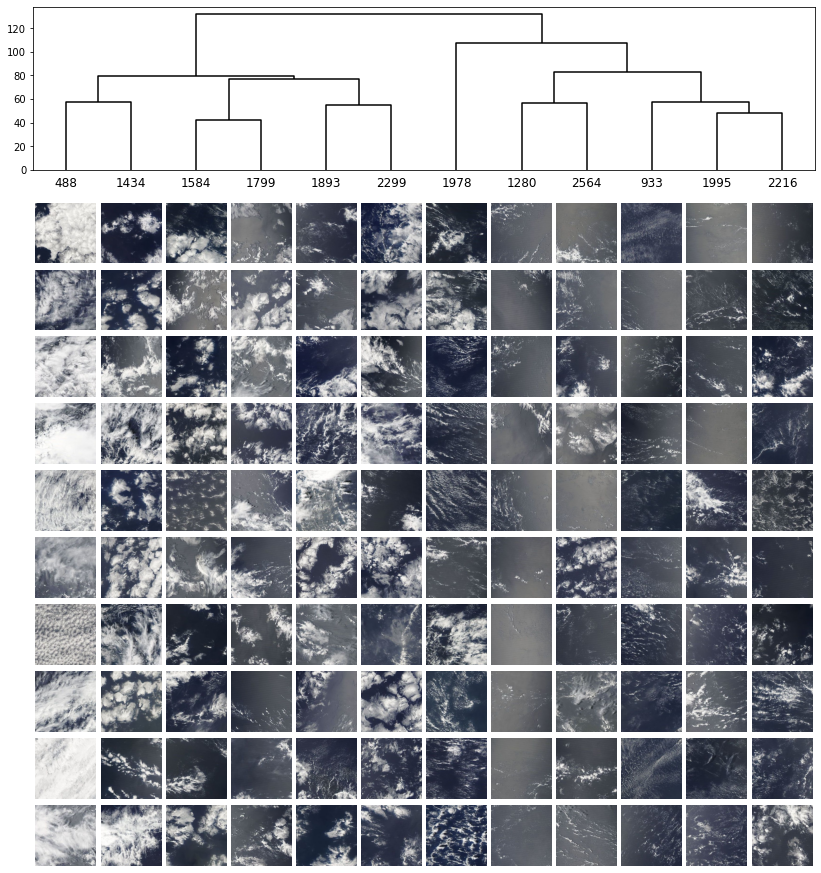

In [11]:
clusters = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)

In [15]:
import importlib
import utils
importlib.reload(utils)
print(visualize_boxes_cluster)
print(DATASET_DIR)

4.5.3
<function visualize_boxes_cluster at 0x7f6d748af5e0>
/home/fbrient/Dropbox/Documents/EUREC4A/Data/Kaggle/


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


error: OpenCV(4.5.3) /tmp/pip-req-build-afu9cjzs/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


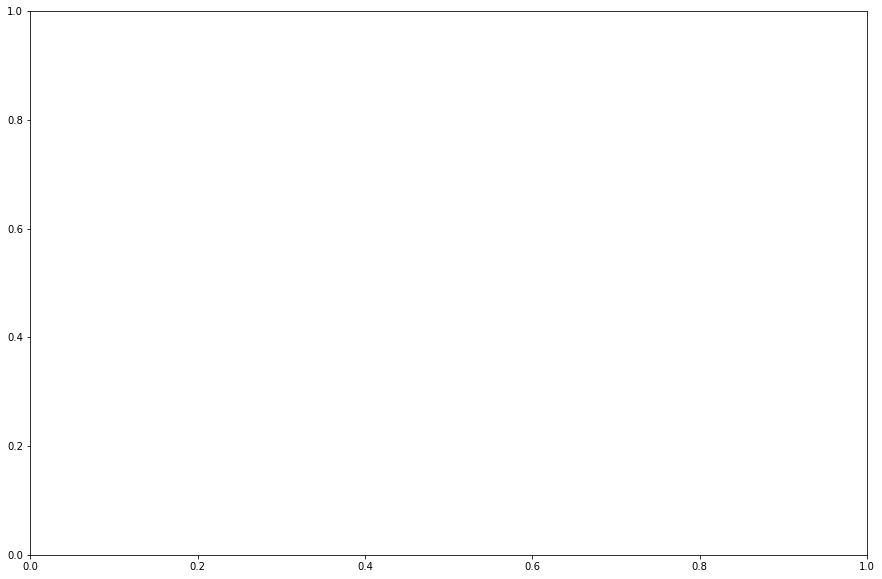

In [16]:
member = randint(0, len(train_samples))
visualize_boxes_cluster(df, train_samples[member])
visualize_domain(df, train_samples[member])


## Predicting confusion matrices

In [17]:
print(len(clusters[1]))
print(len(labs))

20463
20463


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [18]:
cfs_mat = confusion_matrix(labs, clusters[1])

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [19]:
print(cfs_mat[:4,:])

[[ 286  315  365  453  480  851  348  211  406   56  197  284]
 [ 123  973  973  982  715  640  285  274  878   61  260  576]
 [  43   84  117  165  336  291  496  203  477  113  383  394]
 [  36   62  129  199  362  517  849  592  803  703 1155  962]]


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(4, 12)
(4,)
(12, 4)


<AxesSubplot:title={'center':'Confusion Matrix Clusters Leif model %'}>

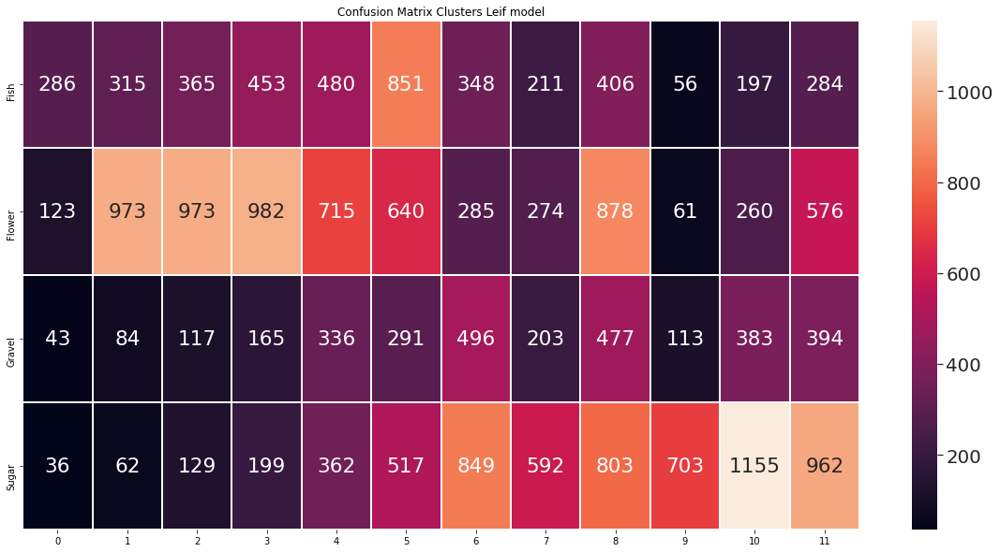

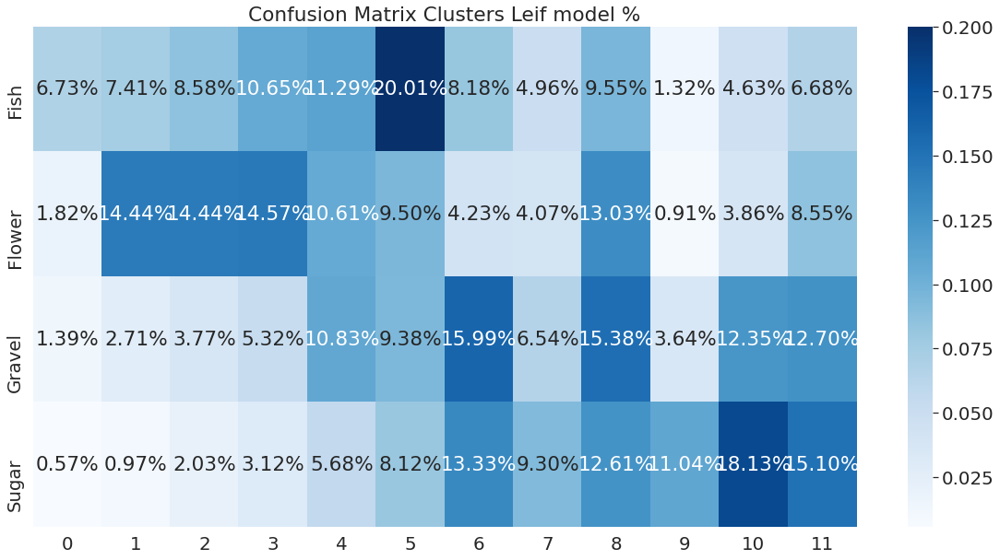

In [20]:

associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

# Random Dirichlet

[[ 576.  259.  241.  179. 1297.  146.  534.  304.  269.   81.  215.  149.]
 [ 911. 1040.  116.  357.  195.  318.  631.  989. 1054.  265.  319.  545.]
 [ 473.  274.  473.   35.  831.  377.   68.  157.   17.   26.  131.  240.]
 [ 889.  133.  846.  519.  711.  291.  713.   30.  526. 1191.  161.  358.]]
(4, 12)
(4,)
(12, 4)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:title={'center':'Confusion Matrix Random Dirichlet %'}>

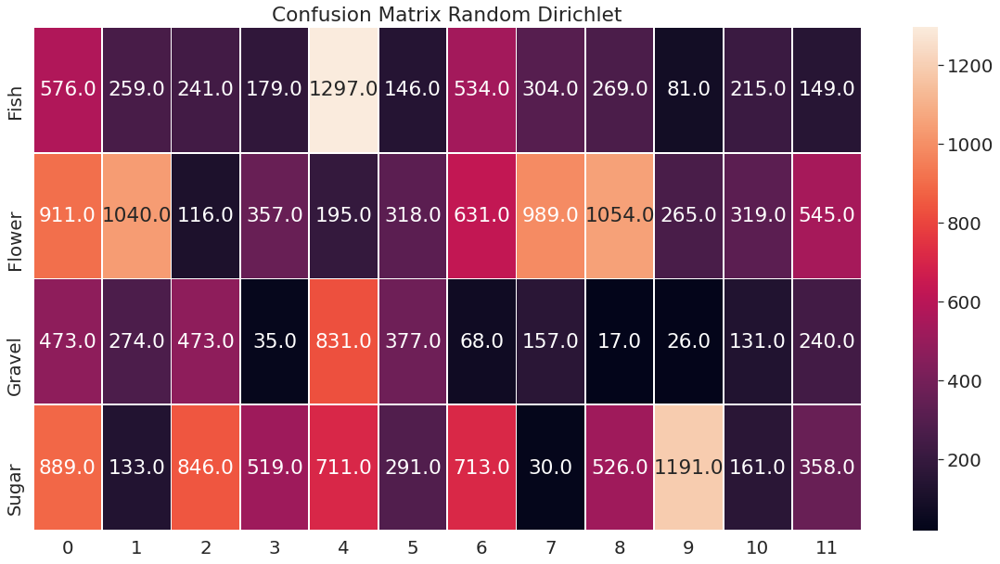

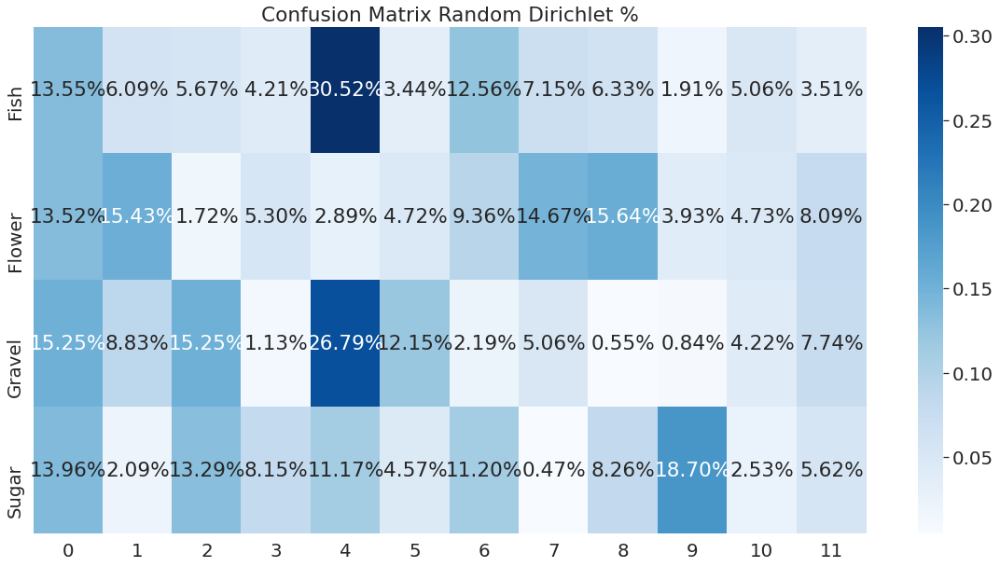

In [21]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
numbers = [4252,6740, 3102, 6369]
conf_mat = []
for num in numbers:
    row = np.random.dirichlet(np.ones(12),size=1)*num
    #print(row)
    conf_mat.append(np.round(row[0]))
cfs_mat = np.array(conf_mat)
print(cfs_mat)
#cfs_mat = confusion_matrix(labs, clusters[1])
fig, ax = plt.subplots(figsize=(20,10)) 
plt.title("Confusion Matrix Random Dirichlet")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Random Dirichlet %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

# Random Uniform

(4, 12)
(4, 12)
(4,)
(12, 4)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:title={'center':'Confusion Matrix Random Uniform %'}>

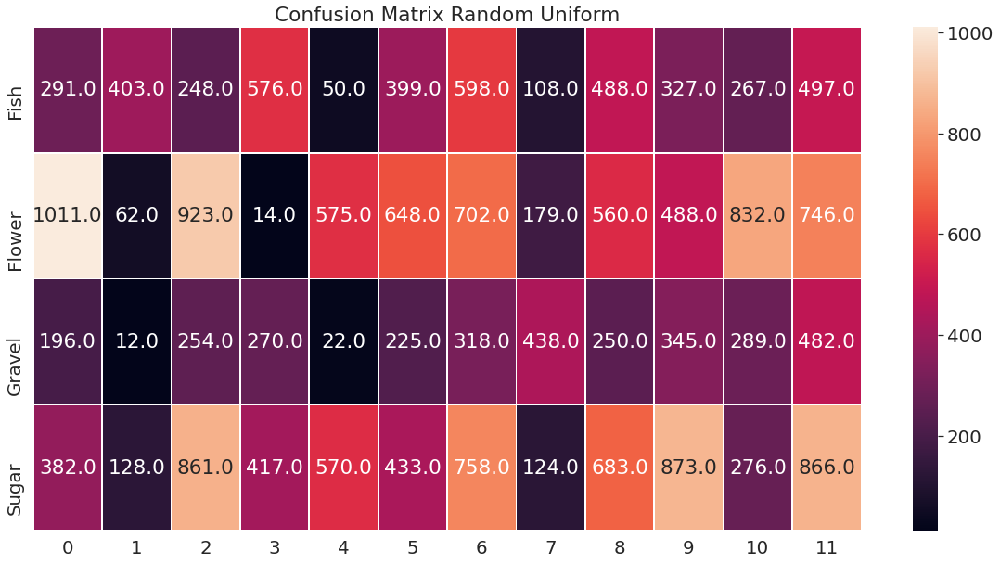

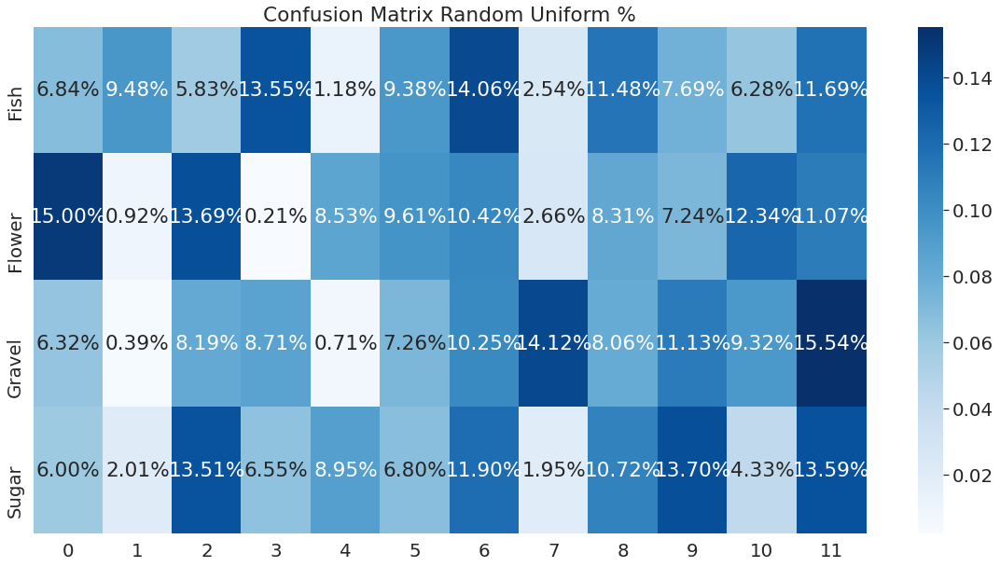

In [22]:
import seaborn as sns
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
numbers = [4252,6740, 3102, 6369]
conf_mat = []
for num in numbers:
    row = np.random.uniform(size=12)
    row = row/row.sum()
    row = row*num
    #print(row)
    conf_mat.append(np.round(row))
#print(row)
cfs_mat = np.array(conf_mat)
#print(cfs_mat)
#cfs_mat = confusion_matrix(labs, clusters[1])
print(cfs_mat.shape)
fig, ax = plt.subplots(figsize=(20,10))
plt.title("Confusion Matrix Random Uniform")
sns.set(font_scale=1.8)
sns.heatmap(cfs_mat[:4,:], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(20,10))
print(cfs_mat[:4,:].shape)
print(   np.sum(  cfs_mat[:4,:], axis=1  ).shape  )
print(   (  cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)    ).shape  )
plt.title("Confusion Matrix Random Uniform %")
sns.heatmap( (cfs_mat[:4,:].T/np.sum(cfs_mat[:4,:], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Exception: No train data was found

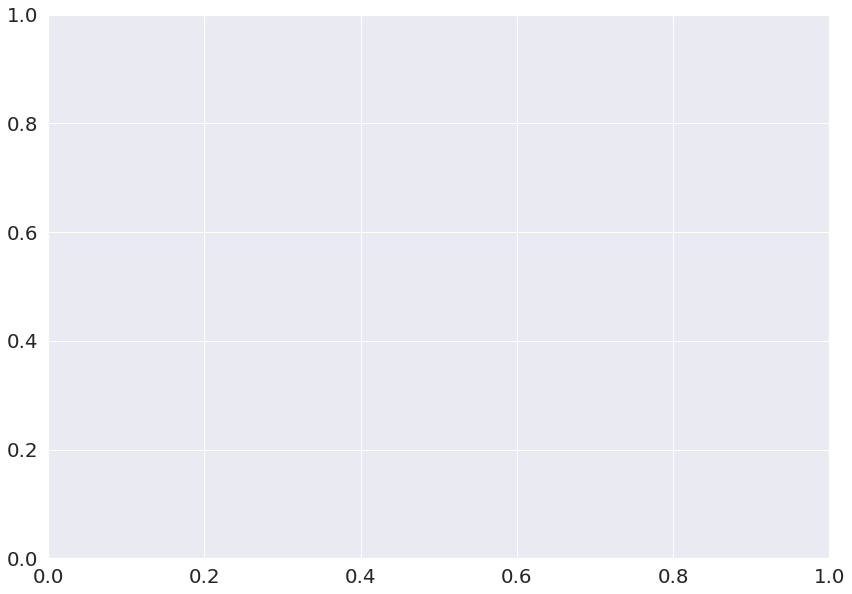

In [23]:
x = da_embeddings.sel(emb_dim=0)
y = da_embeddings.sel(emb_dim=1)
#fig, ax = plt.subplots(figsize=(8,6))
ax = None
_ = convml_tt.interpretation.plots.annotated_scatter_plot(x=x, y=y, points=20, ax=ax)

# PCA

In [24]:
print(len(da_embeddings))
pca_2d = PCA(n_components=2, svd_solver='arpack')
principalComponents = pca_2d.fit_transform(da_embeddings)
print(principalComponents.shape)

20463
(20463, 2)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(20463,)
[ 1.159121  -0.8410387 -0.787757  ...  0.6483141 -0.9547597 -1.1438599]






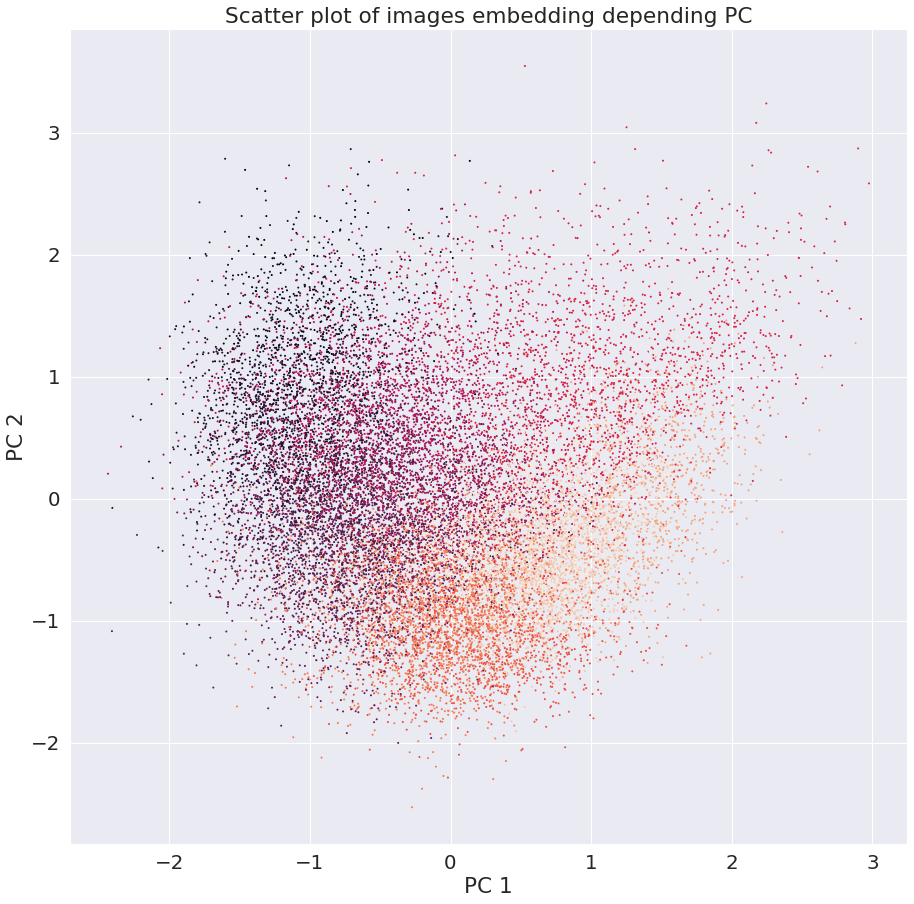

(205,)
[ 1.8724128  -0.41117632  0.45942605  0.46151736 -0.42274725  0.9318008
  0.91519105  0.8082606  -0.67208767 -0.13453938 -0.85376495  0.7182515
  0.02575805  0.63533753  0.2602828  -0.5182566  -0.19503011  0.32828927
  0.29283366 -0.29444942  0.3366672   0.36700463  0.9652134  -1.1676952
 -0.675234    0.41944674 -1.4950318   1.3004615  -0.65681106  2.542333
 -0.48682007  1.5382409  -0.86583567 -0.2259591   0.5612771   0.2773455
 -0.36491057  0.45267573 -0.7988593   1.0016059   0.87947696  1.666834
  0.9487972   1.7858818   0.9909672   0.6120918   0.18089364 -0.8366454
  1.6005317  -0.7043317  -1.0323963  -0.5035996  -0.31935275 -0.4514435
  0.5644091  -0.91871065  0.36057544 -0.9841798   0.19174041 -0.39862895
  2.3872757   0.65403414  0.8712805  -0.56972545  0.13250948  0.76155
 -0.89039636 -1.0725225   1.0002162   0.15806481 -0.39416766 -1.3724158
  0.3957104  -1.2971659  -0.38423482  0.40794006  0.54645306  0.58828396
  0.37247333 -0.8390562   0.91022426 -0.3927271   1.078271

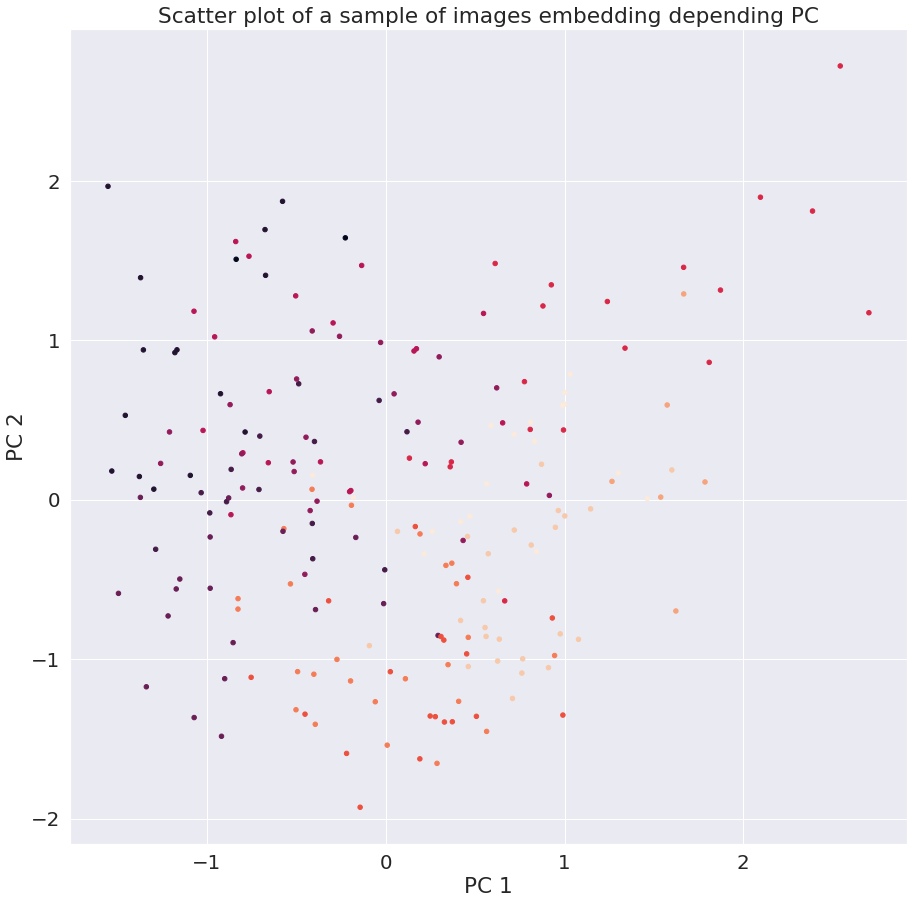

In [25]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( principalComponents, clusters[1], test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=clusters[1], s=1)
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

print(X_test[:, 0].shape)
print(X_test[:, 0])
print("\n\n\n")
fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20)
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

# Domain Analysis

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


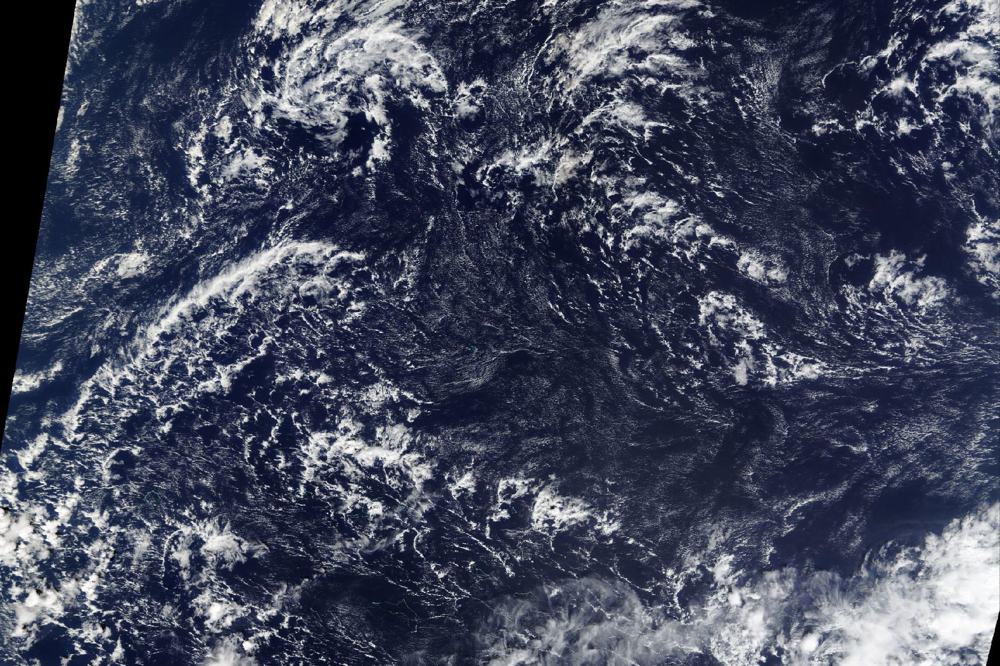

In [28]:
#img = Image.open("../../../NC/zooniverse/train_images/2d9da73.jpg")
img = Image.open(DATASET_DIR+"train_images/2d9da73.jpg")

img

In [29]:
da_emb = make_sliding_tile_model_predictions(img=img, model=model, step=(100, 100))

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
100%|██████████| 8/8 [00:08<00:00,  1.05s/it]


In [30]:
print(da_emb.shape)

(100, 19, 12)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


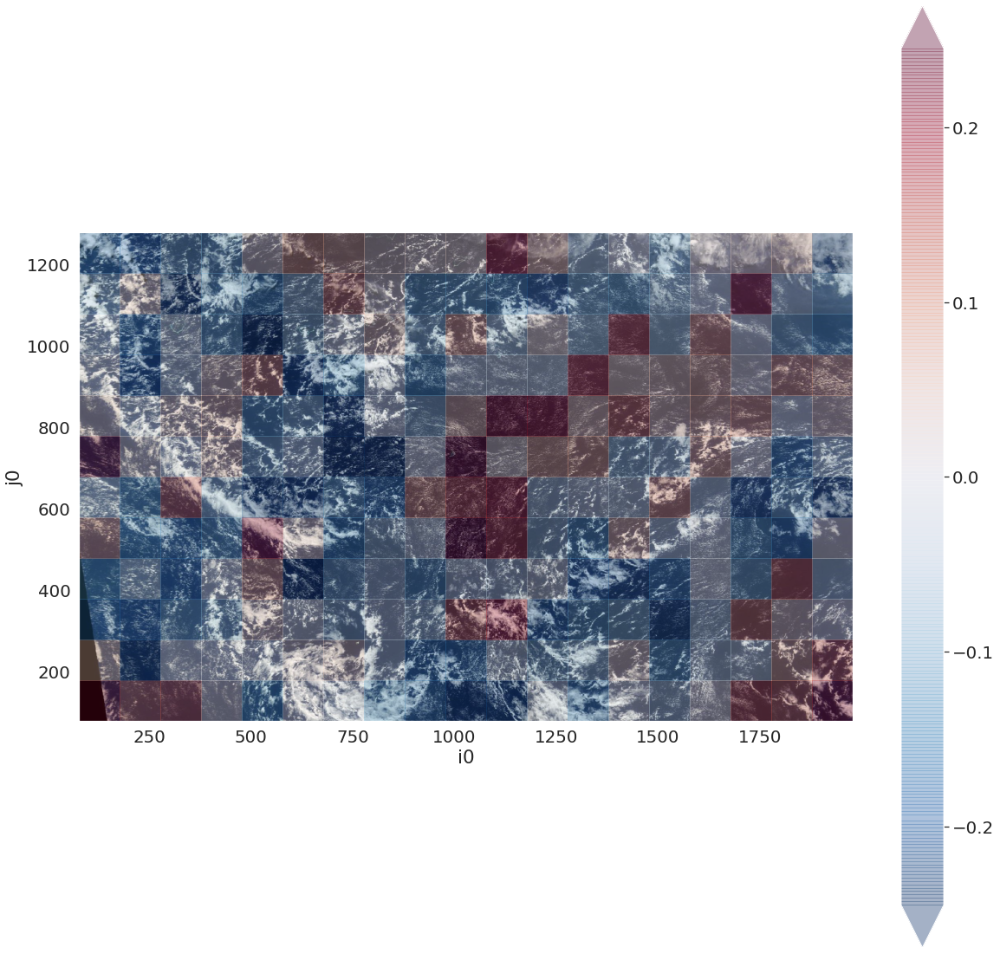

In [31]:
r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(img)
da_emb.isel(emb_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/fbrient/anaconda3/lib/python3.8/site-packages/xarray/core/dataarray.py:789: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  return key in self.data


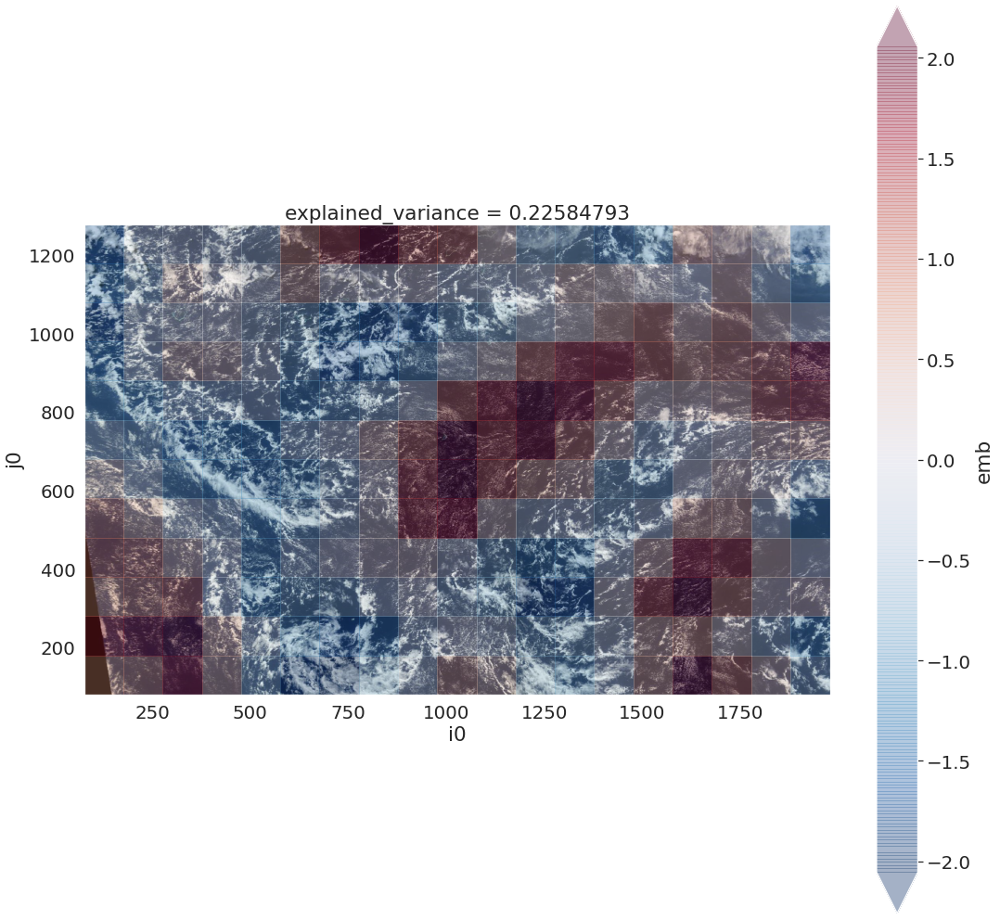

In [32]:
da_emb_pca = apply_transform(da_emb, "pca")

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=0).plot(ax=ax, y="j0", alpha=0.3, robust=True)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


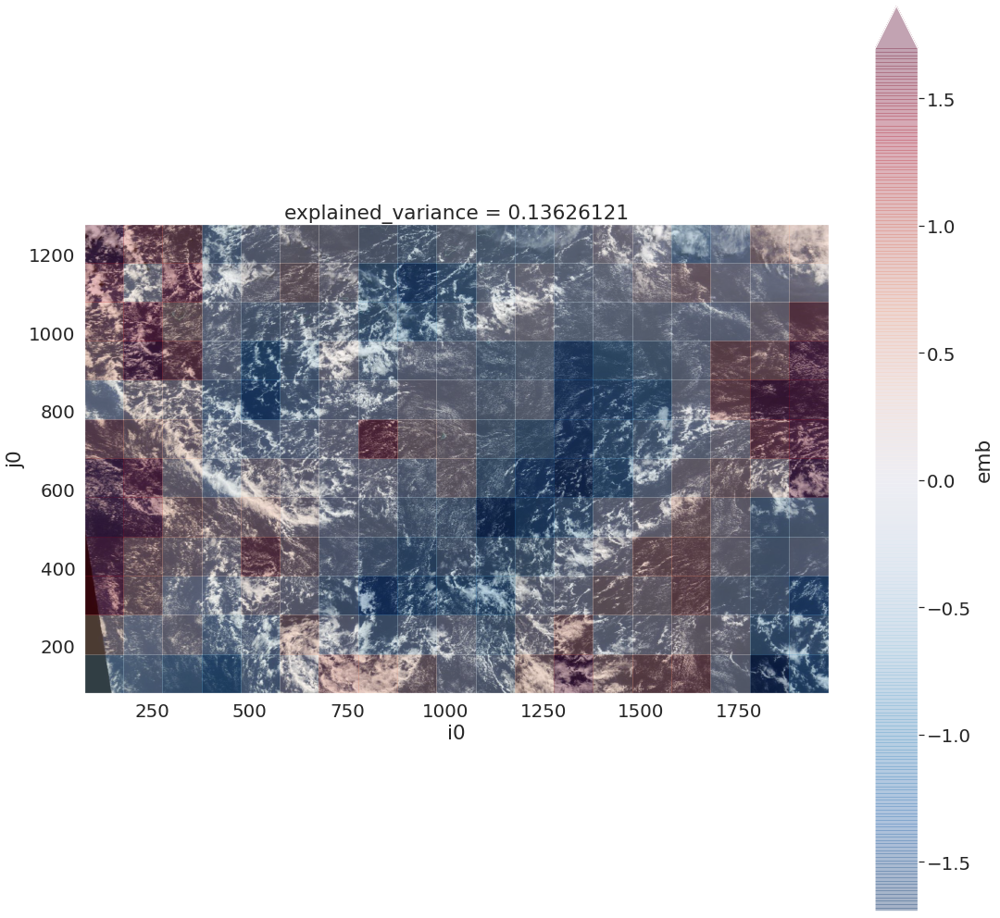

In [33]:
# looking at the second PCA component

r_aspect = img.size[0] / img.size[1] * 1.4
fig, ax = plt.subplots(figsize=(18,18))
ax.imshow(img)
da_emb_pca.isel(pca_dim=1).plot(ax=ax, y="j0", alpha=0.3, robust=True)

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<xarray.DataArray 'emb' (pca_dim: 100, i0: 19, j0: 12)>
array([[[ 8.81741524e-01,  1.56716955e+00,  8.84195864e-01, ...,
         -1.79303348e+00, -1.38691497e+00, -1.59073091e+00],
        [ 9.26450789e-01,  1.81703162e+00,  1.00893211e+00, ...,
         -2.49930635e-01, -6.28320456e-01, -3.43498766e-01],
        [ 1.68801236e+00,  2.22089863e+00,  1.16140008e+00, ...,
         -4.52011675e-02,  4.48190272e-01, -2.49572247e-01],
        ...,
        [ 1.04206896e+00,  2.42834792e-01,  9.05623555e-01, ...,
          8.70610774e-01,  5.69558024e-01,  5.21217346e-01],
        [ 3.85521203e-01, -6.24731660e-01,  1.82477236e-01, ...,
          4.11388665e-01, -5.43278158e-01,  1.74888834e-01],
        [-7.38854825e-01, -1.20395088e+00,  3.19891095e-01, ...,
         -1.85136929e-01, -1.11319864e+00, -1.56423247e+00]],

       [[-5.82236826e-01,  4.80673492e-01,  1.37436712e+00, ...,
          9.84979033e-01,  1.24986982e+00,  1.77536333e+00],
        [-4.33831424e-01,  4.56593838e-03,  7.2

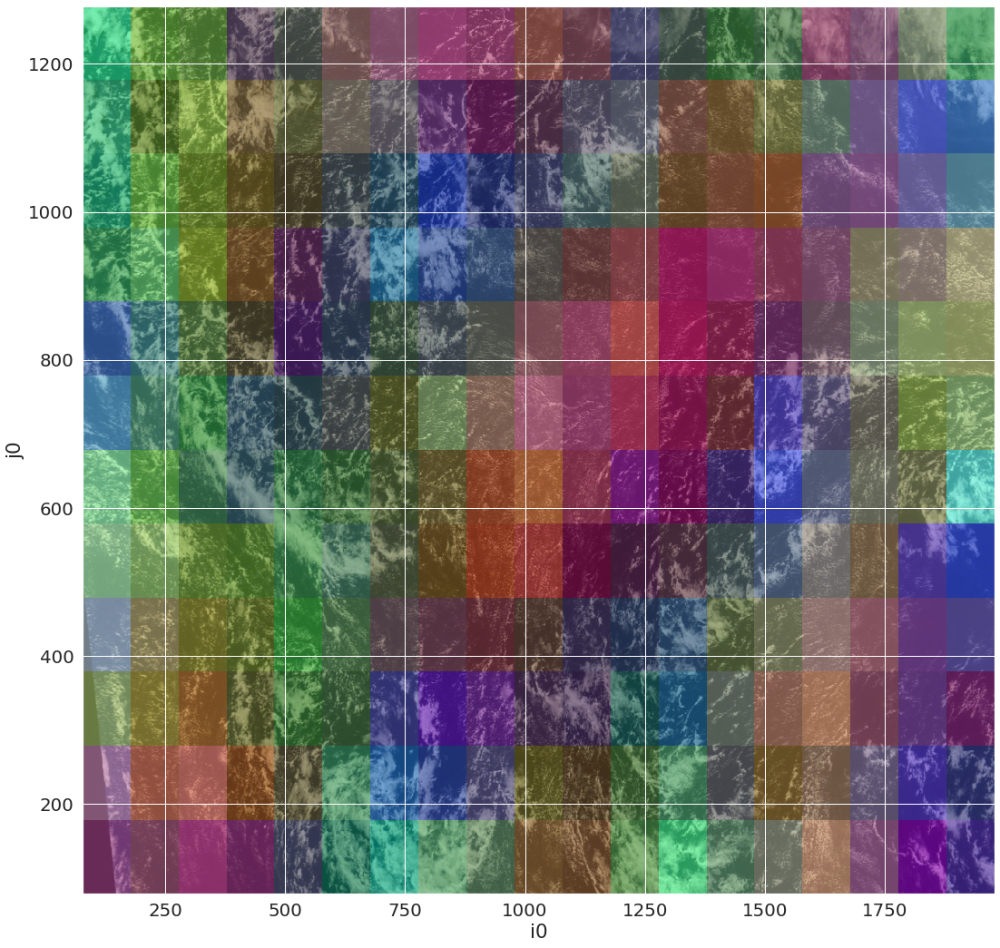

In [38]:
da_rgba = make_rgb(da_emb_pca, pca_dim=[0,1,2], alpha=0.6)
r_aspect = img.size[0] / img.size[1]
fig, ax = plt.subplots(figsize=(18 ,18))
ax.imshow(img)
da_rgba.plot.imshow(rgb="rgba", y="j0", ax=ax)

# Plot PCA Space with classes labels

/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(20463,)
[ 1.159121  -0.8410387 -0.787757  ...  0.6483141 -0.9547597 -1.1438599]






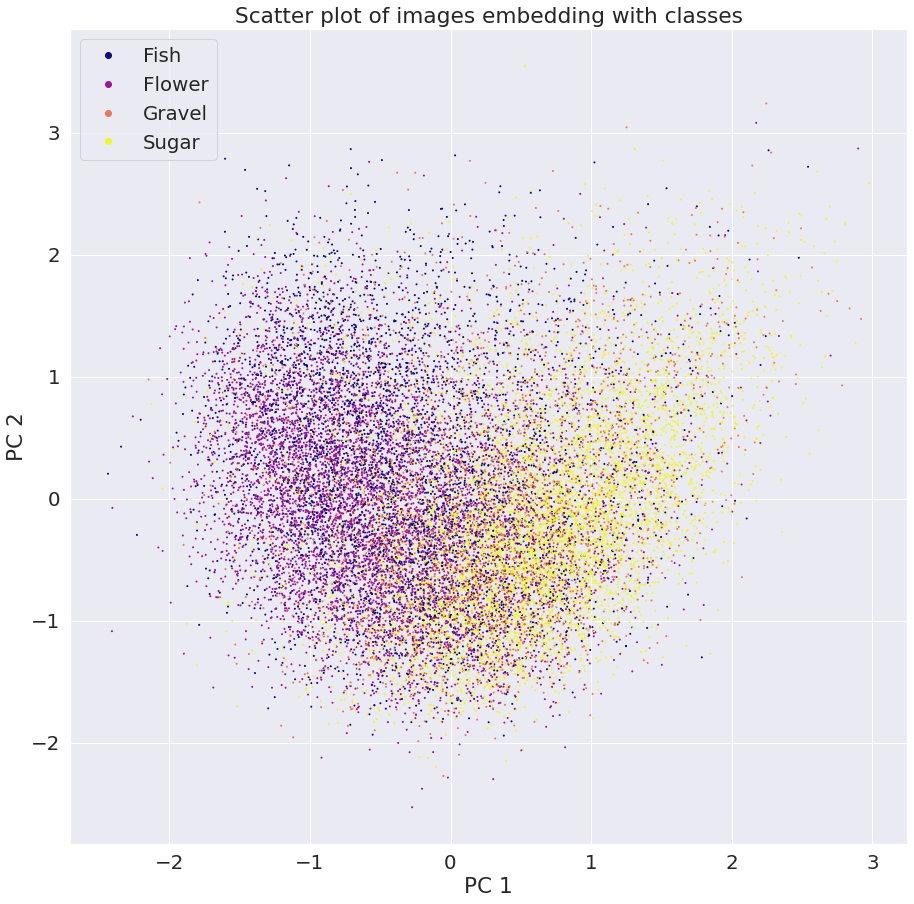

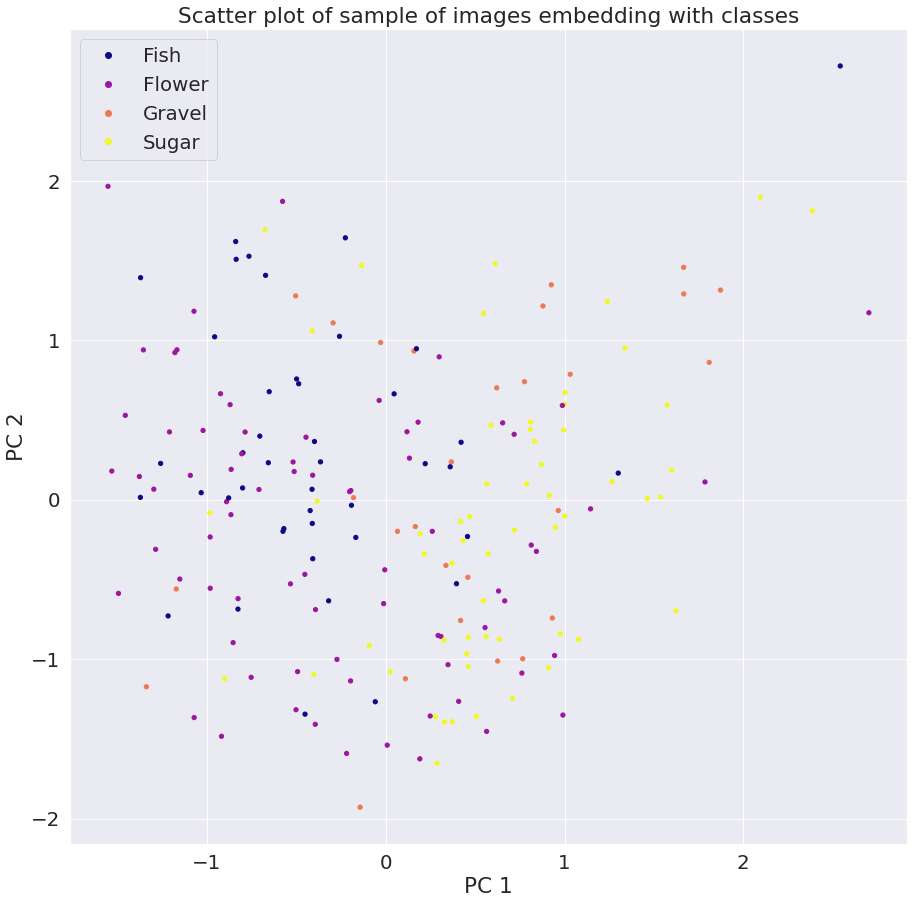

Centroids : 
[[-0.30738142  0.22651444]
 [-0.45592204 -0.03433604]
 [ 0.27974257  0.00468556]
 [ 0.55144411 -0.11716811]]
Shape : (4, 2)


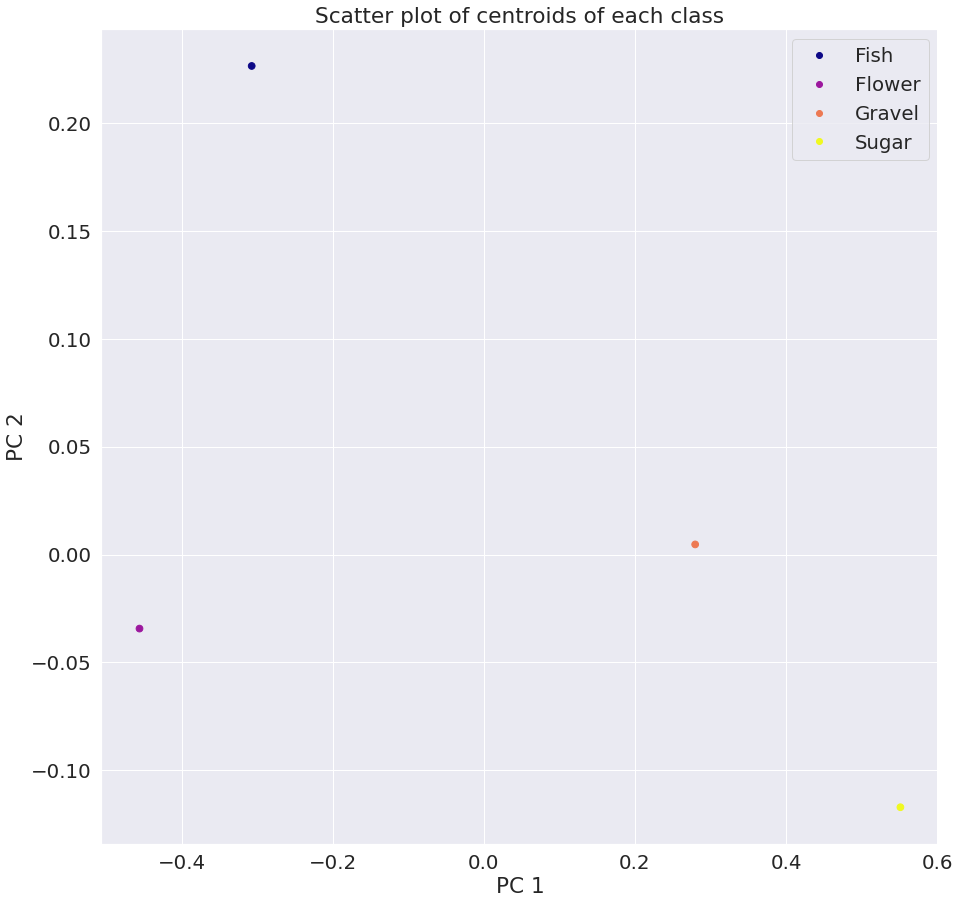

In [39]:
print(principalComponents[:, 0].shape)
print(principalComponents[:, 0])
print("\n\n\n")

labs_np = np.array(labs)
X_train, X_test, y_train, y_test = train_test_split( principalComponents, labs, test_size=0.01, random_state=42)




fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=labs, s=1 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

scatter = ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=18 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of sample of images embedding with classes')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()





clf = NearestCentroid()
clf.fit(principalComponents, labs)
fig, ax = plt.subplots(figsize=(15,15))
print("Centroids : ")
print(clf.centroids_)
print("Shape : "+str(clf.centroids_.shape))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], c=[0, 1, 2, 3], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



# K-Means Clustering

## Training and applying on zooniverse

In [46]:
#import convml_tt.interpretation
#import convml_tt.interpretation
# convml_tt.interpretation.plots.kmeans

kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=True,
    visualize=True,
    model_path=None,
    method="optimize",
    )


/home/fbrient/anaconda3/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


NameError: name 'ImageSingletDataset' is not defined

In [ ]:
cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:2], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:2].T/np.sum(cfsss_mat[:4,:2], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

## Training on Amazon dataset and applying to zooniverse

In [ ]:
path_kmeans = "kmeans_model.pkl"
dataset_path_amazon =  'data/Nx256_s200000.0_N500study_N2000train/'
tile_dataset_amazon = ImageSingletDataset(data_dir=dataset_path_amazon, tile_type=TileType.ANCHOR)
embd_amazon = get_embeddings(tile_dataset=tile_dataset_amazon, model=model)
clusters_amazon = convml_tt.interpretation.plots.dendrogram(da_embeddings, n_samples=10, n_clusters_max=12, return_clusters=True)


In [ ]:
kmeans_clusters, kmeans_model = kmeans(
    embd_amazon,
    save=True,
    visualize=True,
    model_path=None,
    method="optimize",
    )


In [ ]:
path_kmeans = "kmeans_model.pkl"
kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=False,
    visualize=True,
    model_path=path_kmeans,
    method="optimize",
    )

In [ ]:
cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:2], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:2].T/np.sum(cfsss_mat[:4,:2], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()

# KMeans untrained with forced 4 clusters

In [ ]:
kmeans_clusters, kmeans_model = kmeans(
    da_embeddings,
    save=True,
    n=4,
    visualize=False,
    model_path=None,
    method=None,
    )

In [ ]:
import seaborn as sns 

cfsss_mat = confusion_matrix(labs, kmeans_clusters)
associations = ['Fish', 'Flower', 'Gravel', 'Sugar']
fig, ax = plt.subplots(figsize=(25,10)) 
plt.title("Confusion Matrix Clusters Leif model")
sns.set(font_scale=1.8)
sns.heatmap(cfsss_mat[:4,:4], annot=True, fmt='', ax=ax, linewidths=.9, yticklabels=associations)
fig, ax = plt.subplots(figsize=(30,10))
plt.title("Confusion Matrix Clusters Leif model %")
sns.heatmap( (cfsss_mat[:4,:4].T/np.sum(cfsss_mat[:4,:4], axis=1)).T, annot=True, 
            fmt='.2%', cmap='Blues' , yticklabels=associations)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestCentroid
X_train, X_test, y_train, y_test = train_test_split( principalComponents, kmeans_clusters, test_size=0.01, random_state=42)

fig, ax = plt.subplots(figsize=(15,15))

ax.scatter(principalComponents[:, 0], principalComponents[:, 1], c=kmeans_clusters, s=1, cmap="plasma")
plt.title('Scatter plot of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()



fig, ax = plt.subplots(figsize=(15,15))

ax.scatter( X_test[:, 0], X_test[:, 1], c=y_test, s=1, cmap="plasma")
plt.title('Scatter plot of sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


clf = NearestCentroid()
clf.fit(principalComponents, clusters[1])
fig, ax = plt.subplots(figsize=(15,15))
scatter = ax.scatter(clf.centroids_[:, 0], clf.centroids_[:, 1], s=45 , cmap="plasma")
plt.legend(handles=scatter.legend_elements()[0], labels=associations)
plt.title('Scatter plot of centroids of each class')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()


fig, ax = plt.subplots(figsize=(15,15))
ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, s=20, cmap="plasma")
plt.title('Scatter plot of a sample of images embedding depending PC')
ax.set_xlabel('PC 1')
ax.set_ylabel('PC 2')
plt.show()